## Setup

In [ ]:
# standard
import os
import re
import time
import json
import datetime as dt

# data analysis
import pandas as pd
import numpy as np

# # web scraping
import requests
from bs4 import BeautifulSoup

# data viz
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# sql
from sqlalchemy import create_engine
from sqlalchemy.types import *
import psycopg2

# modeling
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels
from statsforecast import StatsForecast
from statsforecast.models import Naive, SeasonalNaive, WindowAverage, SeasonalWindowAverage, AutoARIMA, ARIMA
from scipy.fft import fft, fftfreq

# from prophet import Prophet
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, SimpleRNN, Dropout, LSTM, Flatten, Lambda
from tensorflow.keras.regularizers import l2
import tensorflow as tf

from scipy import stats
from scipy.signal import savgol_filter

import joblib

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [4]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [5]:
# initializing sys

os.environ['NIXTLA_ID_AS_COL'] = '1'
pd.options.mode.copy_on_write = True

In [ ]:
# initializing SQL
sql_engine = create_engine('postgresql://******.eu-north-1.rds.amazonaws.com:5432/')

# conn = sql_engine.connect()

In [7]:
# functions
rides_df_test=pd.DataFrame()

def get_sql_table(table):
    conn = sql_engine.connect()
    df = pd.read_sql(f"SELECT * FROM {table}", con=conn)
    df = df.sort_values(by=["date", "time"], ascending=True)
    conn.close()
    return df

def plot_rides(df):
    return px.line(df, x="datetime", y="sum")

def plot_compare_forecast(df, array=False):
    fig = make_subplots()

    if array:
        fig.add_trace(go.Scatter(x=rides_df_test["datetime"], y=df, name="forecast", line=dict(color="#888888")))
    else:
        fig.add_trace(go.Scatter(x=df["datetime"], y=df["sum"], name="forecast", line=dict(color="#888888")))

    fig.add_trace(go.Scatter(x=rides_df_test["datetime"], y=rides_df_test["sum"], name="truth", line=dict(color="black")))
    fig.update_layout(template="simple_white")
    return fig

def plot_compare_forecast_2array(y_pred, y_true, dt_start):
    fig = make_subplots()
    x = np.arange(len(y_pred))
    if dt_start:
        dt_end = len(y_pred) * 15 * pd.Timedelta(minutes=15) + dt_start
        x = pd.date_range(start=dt_start, end=dt_end, freq="15min")
    fig.add_trace(go.Scatter(x=x, y=y_pred, name="forecast", line=dict(color="#888888")))
    fig.add_trace(go.Scatter(x=x, y=y_true, name="truth", line=dict(color="black")))
    fig.update_layout(template="simple_white")
    return fig


def stats_compare_forecast(df, return_str=True):
    y_true = np.array(rides_df_test["sum"])
    y_pred = np.array(df["sum"])

    if len(y_true) == len(y_pred):
        mae = np.mean(np.abs(y_true - y_pred)).round(3)
        # mse = np.mean((y_true - y_pred)**2).round(3)
        rmse = np.sqrt(np.mean((y_true - y_pred)**2)).round(3)

        # wmape
        absolute_errors = np.abs(y_true - y_pred)
        wmape = ((np.sum(absolute_errors) / np.sum(y_true))*100).round(3)

        if return_str:
            print(f"MAE: {mae}")
            # print(f"MSE: {mse}")
            print(f"RMSE: {rmse}")
            print(f"WMAPE: {wmape} %")
        else:
            return mae, rmse, wmape
        
    else:
        print("Error: Väärän mittainen df")

def stats_compare_forecast_2array(y_pred, y_true, return_str=True):
    if len(y_true) == len(y_pred):
        mae = np.mean(np.abs(y_true - y_pred)).round(3)
        # mse = np.mean((y_true - y_pred)**2).round(3)
        rmse = np.sqrt(np.mean((y_true - y_pred)**2)).round(3)

        # wmape
        absolute_errors = np.abs(y_true - y_pred)
        wmape = ((np.sum(absolute_errors) / np.sum(y_true))*100).round(3)

        # std_dev
        std_dev = np.round(np.std(absolute_errors), 1)

        if return_str:
            print(f"MAE: {mae}")
            # print(f"MSE: {mse}")
            print(f"RMSE: {rmse}")
            print(f"WMAPE: {wmape} %")
            print(f"STD_DEV: {std_dev} %")
        else:
            return mae, rmse, wmape, std_dev
        
    else:
        print("Error: Väärän mittainen df")

def plot_residuals(truth_series, pred_series):
    residuals = truth_series - pred_series
    residuals = pd.Series(residuals)
    residuals.plot()
    plt.axhline(0, linestyle='--', color='k')
    plt.title("Residuals")

In [8]:
# VARIABLES
start_date = dt.date(2024,5,4)
end_date = dt.date(2024,8,22)
train_test_split_date = dt.date(2024,8,1)   # start of test data 
grouper_freq = "15min"
n_periods = int(pd.Timedelta(hours=24) / pd.Timedelta(grouper_freq))   # 48
n_test = pd.Timedelta(end_date - train_test_split_date) + pd.Timedelta(days=1)   # Timedelta(10 days)
test_len = n_periods * int(n_test/pd.Timedelta(days=1))   # 480
rolling_ma = False

# DF - Rides

Muuttujat:
* TZ: Helsinki
* Grouper: 30 min
* MA: 6

In [9]:
rides_df = get_sql_table("rides")

rides_df["datetime"] = pd.to_datetime(rides_df['date'].astype(str) + ' ' + rides_df['time'].astype(str), format='%Y-%m-%d %H:%M:%S')
rides_df = rides_df.groupby(pd.Grouper(key="datetime", freq=grouper_freq))[["FT", "TH", "ME", "MU"]].sum().reset_index()
rides_df["sum"] = rides_df["FT"] + rides_df["TH"] + rides_df["ME"] + rides_df["MU"]
# rides_df["sum_ma"] = rides_df["sum"].rolling(6).mean()
if rolling_ma:
    rides_df["sum"] = rides_df["sum"].rolling(rolling_ma).mean()

rides_df["time"] = rides_df["datetime"].dt.time
rides_df["date"] = rides_df["datetime"].dt.date

# rides_df = rides_df[rides_df["date"]>=start_date]
# rides_df = rides_df[rides_df["date"]<=end_date]

rides_df[["FT", "TH", "ME", "MU"]] = rides_df[["FT", "TH", "ME", "MU"]].applymap(lambda v: np.nan if v > 60 else v)

rides_df.reset_index(inplace=True, drop=True)

rides_df

,datetime,FT,TH,ME,MU,sum,time,date
0,2024-02-16 11:30:00,1,1.0,0,0.0,2,11:30:00,2024-02-16
1,2024-02-16 11:45:00,5,7.0,1,1.0,14,11:45:00,2024-02-16
2,2024-02-16 12:00:00,5,6.0,2,4.0,17,12:00:00,2024-02-16
3,2024-02-16 12:15:00,4,4.0,1,0.0,9,12:15:00,2024-02-16
4,2024-02-16 12:30:00,3,5.0,0,1.0,9,12:30:00,2024-02-16
...,...,...,...,...,...,...,...,...
18636,2024-08-28 14:30:00,7,2.0,1,1.0,11,14:30:00,2024-08-28
18637,2024-08-28 14:45:00,10,9.0,1,0.0,20,14:45:00,2024-08-28
18638,2024-08-28 15:00:00,8,8.0,1,0.0,17,15:00:00,2024-08-28
18639,2024-08-28 15:15:00,13,14.0,5,4.0,36,15:15:00,2024-08-28


MENEVÄ

In [ ]:
rides_df = rides_df.drop(columns=["sum"])
rides_df["sum"] = rides_df["ME"].copy()
rides_df

In [11]:
rides_df_empty = rides_df[["datetime", "sum", "time", "date"]]
rides_df_empty["sum"] = np.nan

Train/test split (SAVGOL)

In [12]:
rides_df_train1 = rides_df[rides_df["date"]>=dt.date(2024,2,17)]
rides_df_train1 = rides_df_train1[rides_df_train1["date"]<dt.date(2024,3,13)].reset_index(drop=True)
rides_df_train1["sum"] = savgol_filter(rides_df_train1["sum"], 9, 2)

rides_df_train2 = rides_df[rides_df["date"]>=dt.date(2024,3,16)]
rides_df_train2 = rides_df_train2[rides_df_train2["date"]<dt.date(2024,3,31)].reset_index(drop=True)
rides_df_train2["sum"] = savgol_filter(rides_df_train2["sum"], 9, 2)

rides_df_train3 = rides_df[rides_df["date"]>=dt.date(2024,4,2)]
rides_df_train3 = rides_df_train3[rides_df_train3["date"]<dt.date(2024,4,28)].reset_index(drop=True)
rides_df_train3["sum"] = savgol_filter(rides_df_train3["sum"], 9, 2)

rides_df_train4 = rides_df[rides_df["date"]>=dt.date(2024,5,4)]
rides_df_train4 = rides_df_train4[rides_df_train4["date"]<dt.date(2024,8,1)].reset_index(drop=True)
rides_df_train4["sum"] = savgol_filter(rides_df_train4["sum"], 9, 2)

rides_df_test1 = rides_df[rides_df["date"]>=dt.date(2024,8,1)]
rides_df_test1 = rides_df_test1[rides_df_test1["date"]<dt.date(2024,8,22)].reset_index(drop=True)
rides_df_test1["sum"] = savgol_filter(rides_df_test1["sum"], 9, 2)

In [13]:
pd.concat([rides_df_train1, rides_df_train2, rides_df_train3, rides_df_train4])["ME"].describe()

count    14880.000000
mean         1.989449
std          2.582614
min          0.000000
25%          0.000000
50%          1.000000
75%          3.000000
max         22.000000
Name: ME, dtype: float64

In [14]:
fig = make_subplots()
fig.add_trace(go.Scatter(x=rides_df_train1["datetime"], y=rides_df_train1["sum"], name="train1", marker=dict(color="blue")))
fig.add_trace(go.Scatter(x=rides_df_train2["datetime"], y=rides_df_train2["sum"], name="train2", marker=dict(color="blue")))
fig.add_trace(go.Scatter(x=rides_df_train3["datetime"], y=rides_df_train3["sum"], name="train3", marker=dict(color="blue")))
fig.add_trace(go.Scatter(x=rides_df_train4["datetime"], y=rides_df_train4["sum"], name="train4", marker=dict(color="blue")))
fig.add_trace(go.Scatter(x=rides_df_test1["datetime"], y=rides_df_test1["sum"], name="test", marker=dict(color="red")))

fig.update_traces(connectgaps=False)

Train/test split (SAVGOL) (old)

In [15]:
rides_df_train = rides_df[rides_df["date"]<train_test_split_date].drop(columns=["FT", "TH", "ME", "MU"]).reset_index(drop=True)
rides_df_test = rides_df[rides_df["date"]>=train_test_split_date].drop(columns=["FT", "TH", "ME", "MU"]).reset_index(drop=True)

In [16]:
rides_df_train["sum"] = savgol_filter(rides_df_train["sum"], 9, 2)
rides_df_test["sum"] = savgol_filter(rides_df_test["sum"], 9, 2)

In [17]:
print(f"TRAIN days: {len(rides_df_train)/n_periods}")
print(f"TEST days: {len(rides_df_test)/n_periods}")

TRAIN days: 166.52083333333334
TEST days: 27.65625


In [18]:
rides_df_test_empty = rides_df_test[["datetime", "sum", "time", "date"]]
rides_df_test_empty["sum"] = np.nan
rides_df_test_empty

,datetime,sum,time,date
0,2024-08-01 00:00:00,NaN,00:00:00,2024-08-01
1,2024-08-01 00:15:00,NaN,00:15:00,2024-08-01
2,2024-08-01 00:30:00,NaN,00:30:00,2024-08-01
3,2024-08-01 00:45:00,NaN,00:45:00,2024-08-01
4,2024-08-01 01:00:00,NaN,01:00:00,2024-08-01
...,...,...,...,...
2650,2024-08-28 14:30:00,NaN,14:30:00,2024-08-28
2651,2024-08-28 14:45:00,NaN,14:45:00,2024-08-28
2652,2024-08-28 15:00:00,NaN,15:00:00,2024-08-28
2653,2024-08-28 15:15:00,NaN,15:15:00,2024-08-28


In [19]:
fig = make_subplots()
fig.add_trace(go.Scatter(x=rides_df_train["datetime"], y=rides_df_train["sum"], name="train", marker=dict(color="red")))
fig.add_trace(go.Scatter(x=rides_df_test["datetime"], y=rides_df_test["sum"], name="test", marker=dict(color="blue")))

In [20]:
fig = make_subplots()
fig.add_trace(go.Scatter(x=rides_df["datetime"], y=rides_df["ME"], name="ME"))
fig.add_trace(go.Scatter(x=rides_df["datetime"], y=rides_df["TH"], name="TH"))
fig.add_trace(go.Scatter(x=rides_df["datetime"], y=rides_df["FT"], name="FT"))
fig.add_trace(go.Scatter(x=rides_df["datetime"], y=rides_df["MU"], name="MU"))


## EDA

In [ ]:
from statsmodels.tsa.stattools import adfuller

# Perform ADF test
result = adfuller(rides_df_train['sum'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
for key, value in result[4].items():
    print('Critical Values:')
    print(f'   {key}, {value}')

ADF: Dataset is stationary.

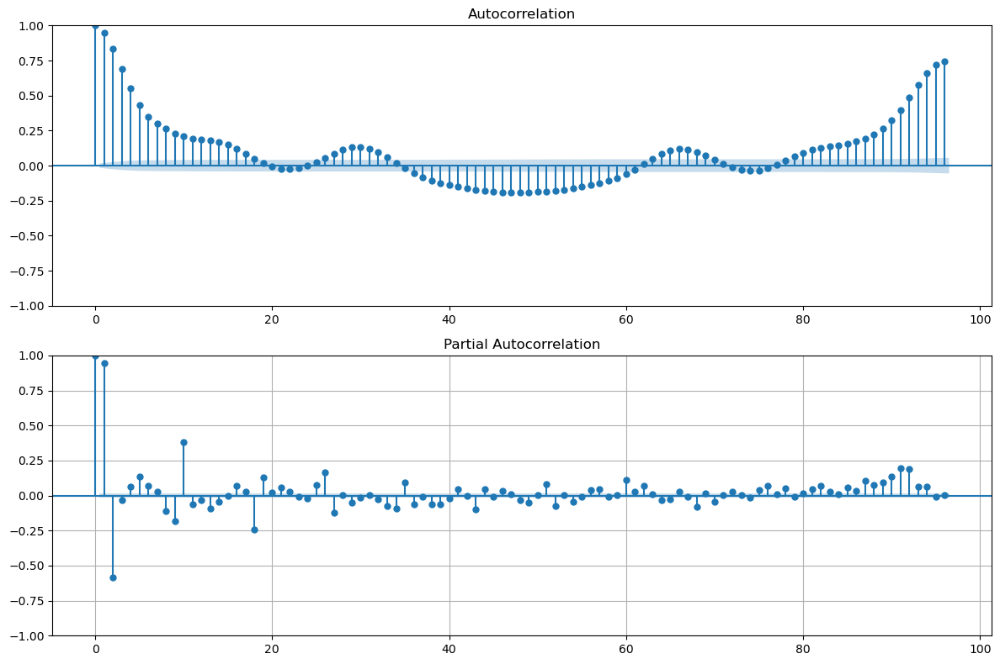

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(rides_df_train['sum'], ax=ax[0], lags=n_periods)
plot_pacf(rides_df_train['sum'], ax=ax[1], lags=n_periods)
plt.tight_layout()
# plt.ylim(-0.25, 0.25)
plt.grid()
plt.show()

Autocorrelation: Melko korreloitunut 24h taaksepäin

# DF- Flights

In [30]:
flights_df = get_sql_table("flights")
flights_df["datetime"] = pd.to_datetime(flights_df['date'].astype(str) + ' ' + flights_df['time'].astype(str), format='%Y-%m-%d %H:%M:%S')

# # SHIFT !!
flights_df["datetime"] = flights_df["datetime"] + dt.timedelta(hours=1)
flights_df["date"] = flights_df["datetime"].dt.date
flights_df["time"] = flights_df["datetime"].dt.time

flights_df_raw = flights_df.copy()
flights_df = flights_df.groupby(pd.Grouper(key="datetime", freq=grouper_freq))["Capacity"].sum().reset_index()
# flights_df["datetime"] = flights_df["datetime"] + pd.Timedelta(hours=1)
flights_df["date"] = flights_df["datetime"].dt.date

flights_df["Capacity"] = savgol_filter(flights_df["Capacity"], 9,2)

# flights_df = flights_df[flights_df["date"]>=start_date]
# flights_df = flights_df[flights_df["date"]<=end_date]

flights_df.fillna(0, inplace=True)
flights_df.reset_index(inplace=True, drop=True)

# flights_df.head(20)

In [31]:
flights_df_train = flights_df[flights_df["date"]<train_test_split_date].reset_index(drop=True)
flights_df_test = flights_df[flights_df["date"]>=train_test_split_date].reset_index(drop=True)

## Flight number df

In [32]:
flight_nr_df = flights_df_raw.groupby("datetime")["fltnr"].apply(list).reset_index()
flight_nr_df = flight_nr_df.explode(column="fltnr")
flight_nr_df = pd.get_dummies(flight_nr_df, columns=["fltnr"], dtype="int")
flight_nr_df = flight_nr_df.groupby("datetime").apply("max").reset_index()

flight_nr_df = flight_nr_df.groupby(pd.Grouper(key="datetime", freq=grouper_freq)).apply("sum").reset_index()

flight_nr_df["date"] = flight_nr_df["datetime"].dt.date

# flight_nr_df = flight_nr_df[flight_nr_df["date"]>=start_date]
flight_nr_df = flight_nr_df[flight_nr_df["date"]<=end_date]

flight_nr_df.reset_index(inplace=True, drop=True)

columns_to_drop = [col for col in flight_nr_df.columns if col != 'datetime' and flight_nr_df[col].max() == 0]

flight_nr_df = flight_nr_df.drop(columns=columns_to_drop)
# flight_nr_df["datetime"] = flight_nr_df["datetime"].shift(-2)

flight_nr_df_train = flight_nr_df[flight_nr_df["date"]<train_test_split_date].reset_index(drop=True)
flight_nr_df_test = flight_nr_df[flight_nr_df["date"]>=train_test_split_date].reset_index(drop=True)

flight_nr_df_train = flight_nr_df_train.drop(columns="date")
flight_nr_df_test = flight_nr_df_test.drop(columns="date")


flight_nr_df_test

,datetime,fltnr_6B238,fltnr_6B372,fltnr_6B376,fltnr_6B394,fltnr_6B528,fltnr_6B548,fltnr_6B598,fltnr_6B648,fltnr_6B732,...,fltnr_SK7892,fltnr_TF3920,fltnr_TK1761,fltnr_TK1763,fltnr_TT2011,fltnr_TT2025,fltnr_VBB2216,fltnr_VBB7214,fltnr_VY1268,fltnr_XQ568
0,2024-08-01 00:00:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2024-08-01 00:15:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2024-08-01 00:30:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2024-08-01 00:45:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2024-08-01 01:00:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2107,2024-08-22 22:45:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2108,2024-08-22 23:00:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2109,2024-08-22 23:15:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2110,2024-08-22 23:30:00,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
# flt_nums = flight_nr_df_test.columns.to_list()[1:]
# with open("flt_nums.json","w") as f:
#     json.dump(flt_nums, f)

In [34]:
# with open("flt_nums.json") as f:
#     flt = json.load(f)

In [36]:
flight_nr_df.drop(columns=["date"], inplace=True)

# DF - Sää

In [37]:
def convert_to_float(x):
    try:
        return float(x)
    except:
        return None

In [ ]:
sää_df = pd.read_csv("säädata.csv")
sää_df["datetime"] = sää_df["Vuosi"].astype(str) + "-" + sää_df["Kuukausi"].astype(str) + "-" + sää_df["Päivä"].astype(str) +  " " + sää_df["Aika [Paikallinen aika]"].astype(str)
sää_df["datetime"] = pd.to_datetime(sää_df["datetime"])
sää_df = sää_df.rename(columns={"Lämpötilan keskiarvo [°C]":"temp", "Tunnin sademäärä [mm]":"rain"})

sää_df["temp"] = sää_df["temp"].apply(convert_to_float)
sää_df["rain"] = sää_df["rain"].apply(lambda x: float(str(x).replace("-", "0")))

sää_df = sää_df.ffill()
sää_df = sää_df[["datetime", "temp", "rain"]]
sää_df

In [39]:
sää_df = sää_df.set_index("datetime").resample("15min").first().reset_index().ffill()
sää_df

,datetime,temp,rain
0,2024-01-01 00:00:00,-15.7,0.0
1,2024-01-01 00:15:00,-15.7,0.0
2,2024-01-01 00:30:00,-15.7,0.0
3,2024-01-01 00:45:00,-15.7,0.0
4,2024-01-01 01:00:00,-16.3,0.0
...,...,...,...
22640,2024-08-23 20:00:00,17.5,0.0
22641,2024-08-23 20:15:00,17.5,0.0
22642,2024-08-23 20:30:00,17.5,0.0
22643,2024-08-23 20:45:00,17.5,0.0


# DF - Queue

In [47]:
queue_df_raw = get_sql_table("queue")

In [48]:
queue_df = queue_df_raw.copy()
queue_df["datetime"] = pd.to_datetime(queue_df['date'].astype(str) + ' ' + queue_df['time'].astype(str), format='%Y-%m-%d %H:%M:%S')
queue_df = queue_df.groupby(pd.Grouper(key="datetime", freq=grouper_freq))[["FT", "TH", "ME", "MU"]].mean().reset_index()
queue_df["sum"] = queue_df["FT"] + queue_df["TH"] + queue_df["ME"] + queue_df["MU"]

queue_df["time"] = queue_df["datetime"].dt.time
queue_df["date"] = queue_df["datetime"].dt.date

queue_df.reset_index(inplace=True, drop=True)

queue_df

,datetime,FT,TH,ME,MU,sum,time,date
0,2024-02-19 14:00:00,18.527778,18.027778,7.916667,19.541667,64.013889,14:00:00,2024-02-19
1,2024-02-19 14:15:00,24.056818,23.522727,9.818182,21.215909,78.613636,14:15:00,2024-02-19
2,2024-02-19 14:30:00,25.752809,32.539326,11.000000,21.280899,90.573034,14:30:00,2024-02-19
3,2024-02-19 14:45:00,27.112360,34.674157,10.134831,21.516854,93.438202,14:45:00,2024-02-19
4,2024-02-19 15:00:00,23.370787,32.887640,7.573034,21.449438,85.280899,15:00:00,2024-02-19
...,...,...,...,...,...,...,...,...
18339,2024-08-28 14:45:00,15.000000,34.564706,8.200000,20.000000,77.764706,14:45:00,2024-08-28
18340,2024-08-28 15:00:00,17.523810,34.297619,9.083333,20.000000,80.904762,15:00:00,2024-08-28
18341,2024-08-28 15:15:00,13.238095,34.488095,9.750000,19.904762,77.380952,15:15:00,2024-08-28
18342,2024-08-28 15:30:00,6.341176,33.835294,8.152941,18.811765,67.141176,15:30:00,2024-08-28


## EDA

In [68]:
df_r = rides_df_train4.copy()[["datetime","ME"]]
df_r = df_r.rename(columns={"ME":"rides"})
df_r["rides"] = savgol_filter(df_r["rides"], 5,2)

df_q = queue_df.copy()[["datetime","ME"]]
df_q = df_q.rename(columns={"ME":"queue"})
df_q["queue"] = savgol_filter(df_q["queue"], 5,2)


df = pd.merge(df_r, df_q, on="datetime")

In [69]:
df

,datetime,rides,queue
0,2024-05-04 00:00:00,3.971429,4.866117
1,2024-05-04 00:15:00,1.314286,4.241857
2,2024-05-04 00:30:00,0.228571,3.466269
3,2024-05-04 00:45:00,1.028571,2.495349
4,2024-05-04 01:00:00,2.400000,1.372965
...,...,...,...
8539,2024-07-31 22:45:00,1.971429,12.158704
8540,2024-07-31 23:00:00,1.685714,10.857823
8541,2024-07-31 23:15:00,3.485714,10.117318
8542,2024-07-31 23:30:00,3.142857,9.551660


In [ ]:
px.line(df, x="datetime", y=["rides","queue"])

# Forecasting methods

## Average - kaikki
Otetaan keskiarvo kaikista edeltävistä päivistä, ja ennustetaan sen perusteella seuraava päivä.

In [21]:
average_by_hour = rides_df_train.groupby("time")["sum"].mean().reset_index()
average_by_hour.head()

,time,sum
0,00:00:00,40.609015
1,00:15:00,34.404219
2,00:30:00,27.547356
3,00:45:00,22.384068
4,01:00:00,18.893473


In [22]:
average_by_hour_df = rides_df_test_empty.copy()
average_by_hour_df["sum"] = average_by_hour["sum"].to_list() * int(test_len/n_periods)
average_by_hour_df

,datetime,sum,time,date
0,2024-06-24 00:00:00,40.609015,00:00:00,2024-06-24
1,2024-06-24 00:15:00,34.404219,00:15:00,2024-06-24
2,2024-06-24 00:30:00,27.547356,00:30:00,2024-06-24
3,2024-06-24 00:45:00,22.384068,00:45:00,2024-06-24
4,2024-06-24 01:00:00,18.893473,01:00:00,2024-06-24
...,...,...,...,...
1243,2024-07-06 22:45:00,34.869451,22:45:00,2024-07-06
1244,2024-07-06 23:00:00,41.797827,23:00:00,2024-07-06
1245,2024-07-06 23:15:00,46.712749,23:15:00,2024-07-06
1246,2024-07-06 23:30:00,48.316450,23:30:00,2024-07-06


#### Result

In [22]:
plot_compare_forecast(average_by_hour_df)

In [23]:
stats_compare_forecast(average_by_hour_df)

MAE: 11.7
RMSE: 15.6
WMAPE: 43.31 %


## Average - viikonpäivä

In [ ]:
rides_df_train_c = rides_df_train.copy()
rides_df_train_c["weekday"] = rides_df_train_c["datetime"].dt.weekday
rides_df_train_c

In [245]:
average_by_weekday = rides_df_train_c.groupby(["weekday","time"])["sum"].mean().reset_index()
average_by_weekday

,weekday,time,sum
0,0,00:00:00,85.285714
1,0,00:30:00,67.857143
2,0,01:00:00,37.428571
3,0,01:30:00,59.857143
4,0,02:00:00,33.285714
...,...,...,...
331,6,21:30:00,36.285714
332,6,22:00:00,43.000000
333,6,22:30:00,55.571429
334,6,23:00:00,94.571429


In [ ]:
next_value = rides_df_train_c["weekday"].values[-1] +1 
d_shift = 7-next_value

if d_shift != 0:
    average_by_weekday_shft = average_by_weekday.shift(n_periods * d_shift)
    average_by_weekday_shft.iloc[:n_periods * d_shift] = (average_by_weekday.iloc[-n_periods*d_shift:])
    print(average_by_weekday_shft)
else:
    average_by_weekday_shft = average_by_weekday.copy()
    average_by_weekday_shft

In [272]:
average_by_weekday_df = rides_df_test_empty.copy()
average_by_weekday_df["sum"] = (average_by_weekday_shft["sum"].to_list() * int(test_len/n_periods))[:len(rides_df_test_empty)]
average_by_weekday_df

,datetime,sum,time,date
0,2024-06-19 00:00:00,60.666667,00:00:00,2024-06-19
1,2024-06-19 00:30:00,37.666667,00:30:00,2024-06-19
2,2024-06-19 01:00:00,30.166667,01:00:00,2024-06-19
3,2024-06-19 01:30:00,37.833333,01:30:00,2024-06-19
4,2024-06-19 02:00:00,14.000000,02:00:00,2024-06-19
...,...,...,...,...
811,2024-07-05 21:30:00,41.000000,21:30:00,2024-07-05
812,2024-07-05 22:00:00,43.500000,22:00:00,2024-07-05
813,2024-07-05 22:30:00,51.833333,22:30:00,2024-07-05
814,2024-07-05 23:00:00,109.000000,23:00:00,2024-07-05


#### Result

In [277]:
plot_compare_forecast(average_by_weekday_df)

In [278]:
stats_compare_forecast(average_by_weekday_df)

MAE: 12.1
RMSE: 16.27
WMAPE: 44.81 %


In [ ]:
test_df_filter = -578

In [718]:
plot_compare_forecast_2array(average_by_hour_df["sum"][test_df_filter:-2].values, rides_df_test["sum"][test_df_filter:-2].values)

In [719]:
stats_compare_forecast_2array(average_by_hour_df["sum"][test_df_filter:-2].values, rides_df_test["sum"][test_df_filter:-2].values)

MAE: 11.22
RMSE: 15.37
WMAPE: 38.54 %
STD_DEV: 10.5 %


## Classic

In [25]:
train = rides_df_train[["datetime", "sum"]].rename(columns={"datetime":"ds", "sum":"y"})
train["unique_id"] = "id"

model = StatsForecast(models=[Naive(), 
                              SeasonalNaive(season_length=336), 
                              WindowAverage(window_size=336), 
                              SeasonalWindowAverage(window_size=4, season_length=336)],
                      freq=grouper_freq, n_jobs=-1)
model.fit(train)

StatsForecast(models=[Naive,SeasonalNaive,WindowAverage,SeasWA])

In [26]:
p = model.predict(h=len(rides_df_test.copy()))

<Axes: >

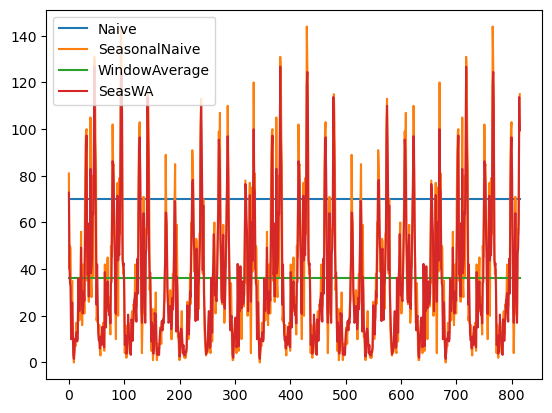

In [27]:
p.iloc[:,2:].plot()

### Naive

In [28]:
forecast_naive = p.rename(columns={"ds":"datetime", "Naive":"sum"})
plot_compare_forecast(forecast_naive)

In [29]:
stats_compare_forecast(forecast_naive)

MAE: 45.43
RMSE: 48.86
WMAPE: 168.24 %


### Seasonal Naive

In [30]:
forecast_seasonal_naive = p.rename(columns={"ds":"datetime", "SeasonalNaive":"sum"})
plot_compare_forecast(forecast_seasonal_naive)

In [31]:
stats_compare_forecast(forecast_seasonal_naive)

MAE: 15.21
RMSE: 20.8
WMAPE: 56.32 %


### Window average

In [32]:
forecast_wa = p.rename(columns={"ds":"datetime", "WindowAverage":"sum"})
plot_compare_forecast(forecast_wa)

In [33]:
stats_compare_forecast(forecast_wa)

MAE: 20.97
RMSE: 24.94
WMAPE: 77.66 %


### Seasonal WA

In [34]:
forecast_seas_wa = p.rename(columns={"ds":"datetime", "SeasWA":"sum"})
plot_compare_forecast(forecast_seas_wa)

In [35]:
stats_compare_forecast(forecast_seas_wa)

MAE: 13.07
RMSE: 17.63
WMAPE: 48.41 %


#### ( For comparison with RFR)

In [202]:
test_df_filter = -765

In [203]:
plot_compare_forecast_2array(forecast_seas_wa["sum"][test_df_filter:-2].values, rides_df_test["sum"][test_df_filter:-2].values)

In [204]:
stats_compare_forecast_2array(forecast_seas_wa["sum"][test_df_filter:-2].values, rides_df_test["sum"][test_df_filter:-2].values)

MAE: 13.27
RMSE: 17.87
WMAPE: 50.35 %
STD_DEV: 12.0 %


## FFT
-Fast Fourier Transformation

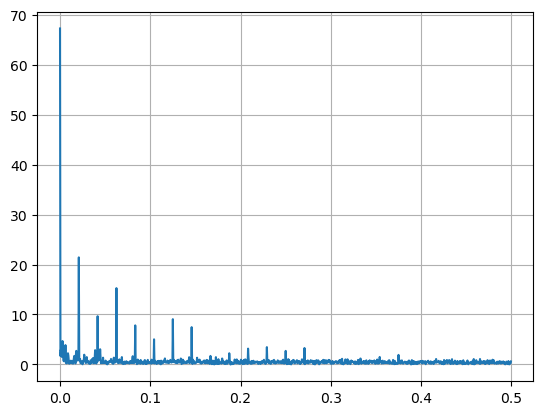

In [36]:
y = rides_df_train["sum"].values[n_periods:]
fft_result = fft(y)

n = len(y)
freq = fftfreq(n, d=1)
magnitude = np.abs(fft_result)

plt.plot(np.abs(freq)[0:n//2], 2.0/n * np.abs(magnitude[0:n//2]))
plt.grid()
plt.show()

In [37]:
f = np.abs(freq)[0:n//2]
m = 2.0/n * np.abs(magnitude[0:n//2])

In [38]:
data = {"f":f, "m":m}
df_fm = pd.DataFrame(data)
df_fm = df_fm.sort_values("m", ascending=False).head(300).reset_index(drop=True)
df_fm

,f,m
0,0.000000,67.212037
1,0.020833,21.424394
2,0.062500,15.272875
3,0.041667,9.654564
4,0.125000,9.062905
...,...,...
295,0.350463,0.644735
296,0.350000,0.642892
297,0.256481,0.641925
298,0.243519,0.641499


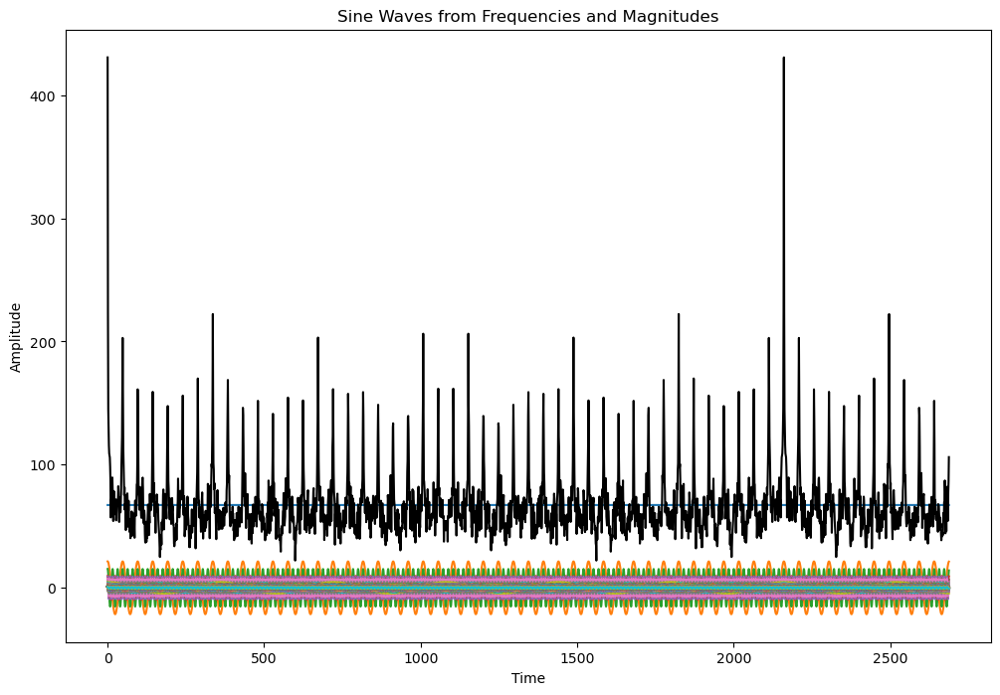

In [39]:
t = np.arange(n+480+n_periods)

# Get the positive frequencies and corresponding magnitudes
positive_freqs = df_fm["f"]
positive_fft_result = df_fm["m"]
positive_magnitudes = np.abs(positive_fft_result)

# Function to create a sine wave from frequency, magnitude, and phase
def create_sine_wave(frequency, magnitude, time):
    return magnitude * np.cos(2 * np.pi * frequency * time)

# Initialize an array to store the reconstructed signal
reconstructed_signal = np.zeros_like(t, dtype=float)

# Plot each sine wave component
plt.figure(figsize=(12, 8))
for frequency, magnitude in zip(positive_freqs, positive_magnitudes):
    sine_wave = create_sine_wave(frequency, magnitude, t)
    reconstructed_signal += sine_wave
    plt.plot(t, sine_wave)

# Plot the sum of the sine waves (reconstructed signal)
plt.plot(t, reconstructed_signal, color='black')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Sine Waves from Frequencies and Magnitudes')
# plt.legend()
plt.show()

In [40]:
px.line(x=t, y=reconstructed_signal)

In [41]:
forecast_fft = rides_df_test.copy()[["datetime","sum"]]
forecast_fft["sum"] = reconstructed_signal[-test_len:]
forecast_fft["sum0"] = forecast_fft["sum"]
forecast_fft

,datetime,sum,sum0
0,2024-06-19 00:00:00,169.953602,169.953602
1,2024-06-19 00:30:00,120.862966,120.862966
2,2024-06-19 01:00:00,93.737632,93.737632
3,2024-06-19 01:30:00,82.820557,82.820557
4,2024-06-19 02:00:00,72.542898,72.542898
...,...,...,...
811,2024-07-05 21:30:00,68.875128,68.875128
812,2024-07-05 22:00:00,54.389447,54.389447
813,2024-07-05 22:30:00,77.170351,77.170351
814,2024-07-05 23:00:00,86.645514,86.645514


In [42]:
plot_compare_forecast(forecast_fft)

In [210]:
# grid_search_df = pd.DataFrame(columns=["a", "b", "rmse"])

In [211]:
# for a in np.arange(-100,50,0.5):
#     for b in np.arange(0,2,0.05):
#         forecast_fft["sum"] = a+ b*forecast_fft["sum0"]
#         rmse = stats_compare_forecast(forecast_fft, return_str=False)[1]
#         grid_search_df.loc[len(grid_search_df.index)+1] = [a, b, rmse]

In [212]:
# grid_search_df.sort_values(by="rmse")

In [479]:
a=4
b=0.5

forecast_fft["sum"] = a+ b*forecast_fft["sum0"]
plot_compare_forecast(forecast_fft)

In [480]:
stats_compare_forecast(forecast_fft)

MAE: 20.5
RMSE: 25.9
WMAPE: 63.7 %


## AR

In [ ]:
train = rides_df_train["sum"].values

model = ARIMA(order=(48, 0, 0))


model.fit(train)

In [ ]:
p = model.predict(h=len(rides_df_test))
# p["mean"]

In [ ]:
forecast_arima = rides_df_test.copy()
forecast_arima["sum"] = p["mean"]
plot_compare_forecast(forecast_arima)

In [ ]:
stats_compare_forecast(forecast_arima)

MAE: 1.00280856104133e+28
RMSE: 4.986902385143365e+28
WMAPE: 2.749303799976231e+28 %


## MA

In [ ]:
train = rides_df_train["sum"].values

model = ARIMA(order=(0, 0, 48))

model.fit(train)

ARIMA

In [55]:
p = model.predict(h=len(rides_df_test))
# p["mean"]

In [56]:
forecast_arima = rides_df_test.copy()
forecast_arima["sum"] = p["mean"]
plot_compare_forecast(forecast_arima)

In [57]:
stats_compare_forecast(forecast_arima)

MAE: 30.4
RMSE: 34.3
WMAPE: 83.3 %


## ARMA

In [58]:
train = rides_df_train["sum"].values

model = ARIMA(order=(48, 0, 48))

model.fit(train)

ARIMA

In [59]:
p = model.predict(h=len(rides_df_test))
# p["mean"]

In [60]:
forecast_arima = rides_df_test.copy()
forecast_arima["sum"] = p["mean"]
plot_compare_forecast(forecast_arima)

In [61]:
stats_compare_forecast(forecast_arima)

MAE: 38.0
RMSE: 57.8
WMAPE: 104.2 %


Text(0.5, 1.0, 'Residuals')

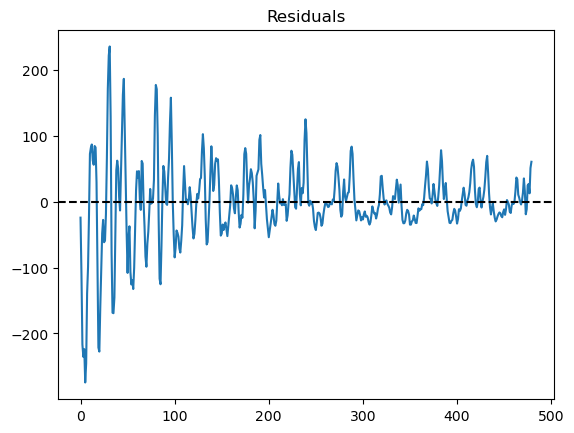

In [62]:
residuals = rides_df_test["sum"] - p["mean"]
residuals = pd.Series(residuals)
residuals.plot()
plt.axhline(0, linestyle='--', color='k')
plt.title("Residuals")

### ARMA - statsmodels

Kokeillaan valita mallista osuvimmat muuttujat

In [ ]:
train = rides_df_train["sum"].values

model = SARIMAX(train, order=(48,0,48), seasonal_order=(0,0,0,0))

model_fit = model.fit()

In [ ]:
params_df = pd.DataFrame(model_fit.summary().tables[1])
params_df = params_df.astype(str)
params_df.columns = ["L", "coef", "std_err", "z", "p", "0.025", "0.975"]
params_df = params_df.iloc[1:]
params_df = params_df.reset_index(drop=True)
params_df["p"] = params_df["p"].astype(float) 
params_df = params_df[params_df["p"]<0.05]
params_df

In [66]:
p = model_fit.forecast(len(rides_df_test))

In [67]:
forecast_arma = rides_df_test.copy()
forecast_arma["sum"] = p
plot_compare_forecast(forecast_arma)

In [68]:
stats_compare_forecast(forecast_arma)

MAE: 32.0
RMSE: 38.1
WMAPE: 87.8 %


### Rolling forecast origin

In [69]:
rolling_predictions = rides_df_test.copy()
dfs = []
for train_end in rolling_predictions["date"].unique():
    train_data = rides_df[rides_df["date"]<=train_end]
    model = ARIMA(order=(48, 0, 48))
    model.fit(train_data["sum"].values)

    p = model.predict(h=48)
    series1 = pd.Series(p["mean"])
    df1 = pd.DataFrame(series1)
    dfs.append(df1)

In [70]:
forecast_arma_rol_for_ori = rides_df_test.copy()
forecast_arma_rol_for_ori["sum"] = pd.concat(dfs)[0].values
forecast_arma_rol_for_ori

,datetime,sum,time,date
0,2024-06-09 00:00:00,107.678121,00:00:00,2024-06-09
1,2024-06-09 00:30:00,175.253710,00:30:00,2024-06-09
2,2024-06-09 01:00:00,208.325241,01:00:00,2024-06-09
3,2024-06-09 01:30:00,189.194977,01:30:00,2024-06-09
4,2024-06-09 02:00:00,212.339363,02:00:00,2024-06-09
...,...,...,...,...
475,2024-06-18 21:30:00,308.874025,21:30:00,2024-06-18
476,2024-06-18 22:00:00,84.166406,22:00:00,2024-06-18
477,2024-06-18 22:30:00,-83.731049,22:30:00,2024-06-18
478,2024-06-18 23:00:00,-61.653876,23:00:00,2024-06-18


In [71]:
plot_compare_forecast(forecast_arma_rol_for_ori)

In [72]:
stats_compare_forecast(forecast_arma_rol_for_ori)

MAE: 165.4
RMSE: 231.8
WMAPE: 453.5 %


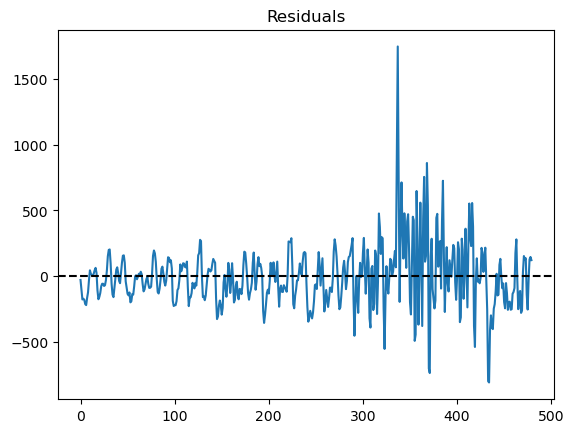

In [73]:
plot_residuals(rides_df_test["sum"], forecast_arma_rol_for_ori["sum"])

## SARIMA

In [279]:
train = rides_df_train["sum"].values

model = SARIMAX(train, order=(0,0,0), seasonal_order=(1,0,1, 48))

model_fit = model.fit()

In [280]:
p = model_fit.forecast(len(rides_df_test))

In [281]:
forecast_sarima = rides_df_test.copy()
forecast_sarima["sum"] = p
plot_compare_forecast(forecast_sarima)

In [282]:
stats_compare_forecast(forecast_sarima)

MAE: 12.45
RMSE: 16.56
WMAPE: 46.1 %


### Rolling forecast origin

In [ ]:
rolling_predictions = rides_df_test.copy()
dfs = []
for train_end in rolling_predictions["date"].unique():
    train_data = rides_df[rides_df["date"]<=train_end]["sum"].values
    model = SARIMAX(train_data, order=(0,0,0), seasonal_order=(1,0,1, 48))
    model_fit = model.fit()

    p = model_fit.forecast(48)
    series1 = pd.Series(p)
    df1 = pd.DataFrame(series1)
    dfs.append(df1)

In [79]:
forecast_sarima_rol_for_ori = rides_df_test.copy()
forecast_sarima_rol_for_ori["sum"] = pd.concat(dfs)[0].values
forecast_sarima_rol_for_ori

,datetime,sum,time,date
0,2024-06-09 00:00:00,82.626488,00:00:00,2024-06-09
1,2024-06-09 00:30:00,62.289067,00:30:00,2024-06-09
2,2024-06-09 01:00:00,40.666609,01:00:00,2024-06-09
3,2024-06-09 01:30:00,34.817595,01:30:00,2024-06-09
4,2024-06-09 02:00:00,30.204784,02:00:00,2024-06-09
...,...,...,...,...
475,2024-06-18 21:30:00,41.714865,21:30:00,2024-06-18
476,2024-06-18 22:00:00,46.640128,22:00:00,2024-06-18
477,2024-06-18 22:30:00,52.188005,22:30:00,2024-06-18
478,2024-06-18 23:00:00,78.450347,23:00:00,2024-06-18


In [80]:
plot_compare_forecast(forecast_sarima_rol_for_ori)

In [81]:
stats_compare_forecast(forecast_sarima_rol_for_ori)

MAE: 7.8
RMSE: 10.4
WMAPE: 21.5 %


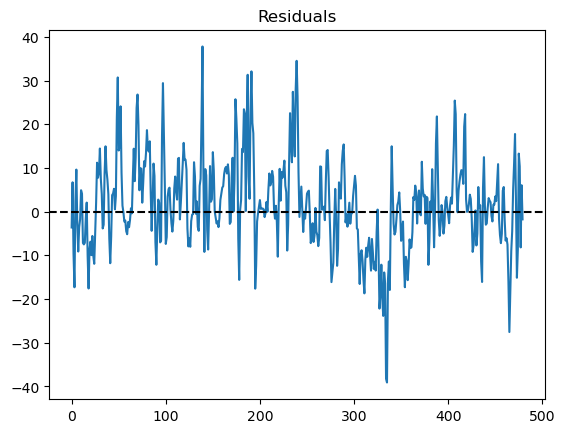

In [82]:
plot_residuals(rides_df_test["sum"], forecast_sarima_rol_for_ori["sum"])

## SARIMAX (+flights)

In [41]:
train = rides_df_train["sum"].values
flights_train_values = flights_df_train["Capacity"].values

model = SARIMAX(train, order=(0,0,0), seasonal_order=(1,0,1, 48), exog=flights_train_values)  # EI (48, 0, 48, 48) !!!

model_fit = model.fit()

In [42]:
flights_test_values = flights_df_test["Capacity"].values

In [43]:
p = model_fit.get_forecast(steps=len(rides_df_test), exog=flights_test_values)

In [44]:
forecast_sarima = rides_df_test.copy()
forecast_sarima["sum"] = p.summary_frame()["mean"]
plot_compare_forecast(forecast_sarima)

In [45]:
stats_compare_forecast(forecast_sarima)

MAE: 8.8
RMSE: 12.1
WMAPE: 24.2 %


## AutoARIMA

In [ ]:
train = rides_df_train["sum"].values
train_df = rides_df_train[["datetime","sum"]].rename(columns={"datetime":"ds", "sum":"y"})
train_df["unique_id"] = "id"

model = AutoARIMA(season_length=48)

sf = StatsForecast(models=[model], freq=grouper_freq, n_jobs=-1)

sf.fit(train_df)

In [ ]:
p = sf.predict(h=len(rides_df_test))
# p["mean"]

In [ ]:
forecast_arima = rides_df_test.copy()
forecast_arima["sum"] = p["AutoARIMA"]
plot_compare_forecast(forecast_arima)

In [ ]:
stats_compare_forecast(forecast_arima)

MAE: 12.0
RMSE: 16.6
WMAPE: 32.8 %


## AutoARIMA (+flights)

In [ ]:
train = rides_df_train["sum"].values
train_df = rides_df_train[["datetime","sum"]]
train_df = train_df.merge(flights_df_train[["datetime", "Capacity"]], on="datetime")
train_df = train_df.rename(columns={"datetime":"ds", "sum":"y"})
train_df["unique_id"] = "id"

model = AutoARIMA(season_length=48)

sf = StatsForecast(models=[model], freq=grouper_freq, n_jobs=-1)

sf.fit(train_df)

StatsForecast(models=[AutoARIMA])

In [ ]:
X_df = flights_df_test[["datetime", "Capacity"]].rename(columns={"datetime":"ds"})
X_df["unique_id"] = "id"
X_df

,ds,Capacity,unique_id
0,2024-06-09 00:00:00,498.0,id
1,2024-06-09 00:30:00,252.0,id
2,2024-06-09 01:00:00,486.0,id
3,2024-06-09 01:30:00,0.0,id
4,2024-06-09 02:00:00,0.0,id
...,...,...,...
475,2024-06-18 21:30:00,420.0,id
476,2024-06-18 22:00:00,404.0,id
477,2024-06-18 22:30:00,1020.0,id
478,2024-06-18 23:00:00,1476.0,id


In [ ]:
p = sf.predict(h=len(rides_df_test), X_df=X_df)
# p["mean"]

In [ ]:
forecast_arima = rides_df_test.copy()
forecast_arima["sum"] = p["AutoARIMA"]
plot_compare_forecast(forecast_arima)

In [ ]:
stats_compare_forecast(forecast_arima)

MAE: 12.0
RMSE: 16.6
WMAPE: 32.8 %


## Seasonal decompose

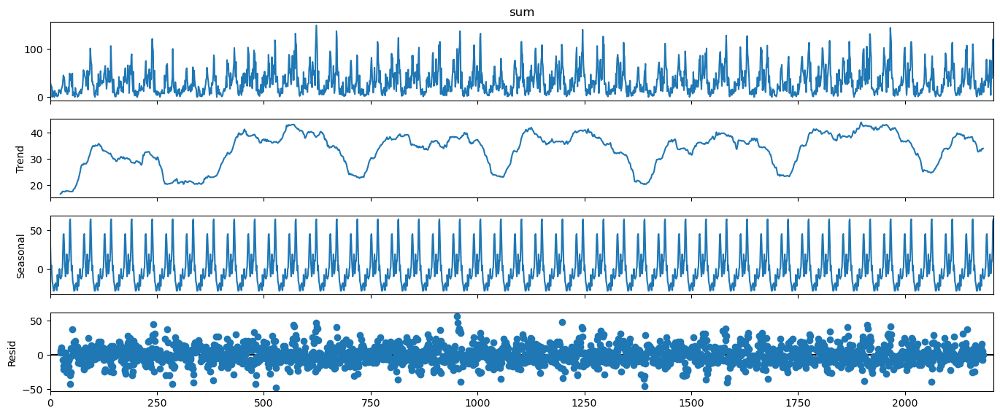

In [ ]:
result = seasonal_decompose(rides_df["sum"], model='additive', period=n_periods)
fig = result.plot()
fig.set_size_inches((15, 6))
plt.show()

# Forecasting - flights-rides

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=rides_df_train["datetime"], y=rides_df_train["sum"], name="train", marker=dict(color="red")))
fig.add_trace(go.Scatter(x=flights_df_train["datetime"], y=flights_df_train["Capacity"], name="pax", marker=dict(color="blue")), secondary_y=True)

In [ ]:
f_r_df = rides_df_train.merge(flights_df_train[["datetime", "Capacity"]], on="datetime")
f_r_df["x"] = f_r_df["sum"] / f_r_df["Capacity"]
f_r_df["x"] = f_r_df["x"].replace(np.inf, 0)
f_r_df

,datetime,sum,time,date,Capacity,x
0,2024-05-04 00:00:00,43,00:00:00,2024-05-04,716.0,0.060056
1,2024-05-04 00:30:00,25,00:30:00,2024-05-04,204.0,0.122549
2,2024-05-04 01:00:00,25,01:00:00,2024-05-04,282.0,0.088652
3,2024-05-04 01:30:00,22,01:30:00,2024-05-04,0.0,0.000000
4,2024-05-04 02:00:00,21,02:00:00,2024-05-04,0.0,0.000000
...,...,...,...,...,...,...
1723,2024-06-08 21:30:00,23,21:30:00,2024-06-08,196.0,0.117347
1724,2024-06-08 22:00:00,12,22:00:00,2024-06-08,960.0,0.012500
1725,2024-06-08 22:30:00,33,22:30:00,2024-06-08,1616.0,0.020421
1726,2024-06-08 23:00:00,59,23:00:00,2024-06-08,1698.0,0.034747


In [ ]:
px.line(x = f_r_df["datetime"], y= f_r_df["x"])

In [ ]:
train = f_r_df[["datetime", "x"]].rename(columns={"datetime":"ds", "x":"y"})
train["unique_id"] = "id"

model = StatsForecast(models=[Naive(), 
                              SeasonalNaive(season_length=336), 
                              WindowAverage(window_size=336), 
                              SeasonalWindowAverage(window_size=4, season_length=336)],
                      freq='30min', n_jobs=-1)
model.fit(train)

StatsForecast(models=[Naive,SeasonalNaive,WindowAverage,SeasWA])

In [ ]:
p = model.predict(h=len(rides_df_test))

In [ ]:
f_r_swa_forecast = rides_df_test.copy()

f_r_swa_forecast["forecast_x"] = p["SeasWA"]
f_r_swa_forecast = f_r_swa_forecast.merge(flights_df_test[["Capacity", "datetime"]])
f_r_swa_forecast["sum"] = f_r_swa_forecast["Capacity"] * f_r_swa_forecast["forecast_x"]
f_r_swa_forecast

,datetime,sum,time,date,forecast_x,Capacity
0,2024-06-09 00:00:00,123.754568,00:00:00,2024-06-09,0.248503,498.0
1,2024-06-09 00:30:00,73.157420,00:30:00,2024-06-09,0.290307,252.0
2,2024-06-09 01:00:00,16.278372,01:00:00,2024-06-09,0.033495,486.0
3,2024-06-09 01:30:00,0.000000,01:30:00,2024-06-09,0.240196,0.0
4,2024-06-09 02:00:00,0.000000,02:00:00,2024-06-09,0.000000,0.0
...,...,...,...,...,...,...
475,2024-06-18 21:30:00,58.922416,21:30:00,2024-06-18,0.140291,420.0
476,2024-06-18 22:00:00,42.575407,22:00:00,2024-06-18,0.105385,404.0
477,2024-06-18 22:30:00,64.068719,22:30:00,2024-06-18,0.062812,1020.0
478,2024-06-18 23:00:00,89.743732,23:00:00,2024-06-18,0.060802,1476.0


In [ ]:
plot_compare_forecast(f_r_swa_forecast)

In [ ]:
stats_compare_forecast(f_r_swa_forecast.replace(np.nan, 0))

MAE: 10.8
RMSE: 15.5
WMAPE: 29.6 %


# AI

## Prophet

In [85]:
train_df = rides_df_train[["datetime", "sum"]].rename(columns={"datetime":"ds", "sum":"y"})
# train_df["y"] = train_df["y"].rolling(2).mean()
# train_df = train_df.bfill()
train_df

,ds,y
0,2024-05-04 00:00:00,46.000000
1,2024-05-04 00:30:00,46.000000
2,2024-05-04 01:00:00,42.833333
3,2024-05-04 01:30:00,38.333333
4,2024-05-04 02:00:00,32.333333
...,...,...
1723,2024-06-08 21:30:00,23.833333
1724,2024-06-08 22:00:00,21.500000
1725,2024-06-08 22:30:00,21.833333
1726,2024-06-08 23:00:00,28.833333


In [86]:
m = Prophet(interval_width=0.95, daily_seasonality=True)
model = m.fit(train_df)

19:08:58 - cmdstanpy - INFO - Chain [1] start processing
19:08:58 - cmdstanpy - INFO - Chain [1] done processing


In [87]:
future = m.make_future_dataframe(periods=480,freq=grouper_freq)
forecast = m.predict(future)
# forecast.head()

In [88]:
pred_values = forecast[-480:]["yhat"].values

In [89]:
forecast_prophet = rides_df_test.copy()
forecast_prophet["sum"] = pred_values
plot_compare_forecast(forecast_prophet)

In [90]:
stats_compare_forecast(forecast_prophet)

MAE: 6.5
RMSE: 8.6
WMAPE: 18.0 %


## Random forest

In [19]:
rfr_window_len = 1 * n_periods + 1   # =7*48=336
rfr_window_len = int(rfr_window_len)

### Datasets

In [20]:
rides_df_train_features = rides_df_train.copy()
rides_df_train_features["weekday"] = rides_df_train_features["datetime"].dt.weekday
rides_df_train_features["time"] = rides_df_train_features['datetime'].dt.hour * 60 + rides_df_train_features['datetime'].dt.minute
rides_df_train_features["1d_ma"] = rides_df_train_features["sum"].rolling(n_periods).mean()
rides_df_train_features["7d_ma"] = rides_df_train_features["sum"].rolling(7*n_periods).mean()
rides_df_train_features["7d_lag"] = rides_df_train_features["sum"].shift(7*n_periods)
rides_df_train_features = rides_df_train_features.merge(flights_df_train)
rides_df_train_features = rides_df_train_features.merge(sää_df)
# rides_df_train_features["Capacity"] = rides_df_train_features["Capacity"].shift(1)
# rides_df_train_features = rides_df_train_features.merge(flight_nr_df_train, how="outer", on="datetime")

rides_df_test_features = rides_df_test.copy()
rides_df_test_features["weekday"] = rides_df_test_features["datetime"].dt.weekday
rides_df_test_features["time"] = rides_df_test_features['datetime'].dt.hour * 60 + rides_df_train_features['datetime'].dt.minute
rides_df_test_features["1d_ma"] = rides_df_test_features["sum"].rolling(n_periods).mean()
rides_df_test_features["7d_ma"] = rides_df_test_features["sum"].rolling(7*n_periods).mean()
rides_df_test_features["7d_lag"] = rides_df_test_features["sum"].shift(7*n_periods)
rides_df_test_features = rides_df_test_features.merge(flights_df_test)
rides_df_test_features = rides_df_test_features.merge(sää_df)
# rides_df_test_features["Capacity"] = rides_df_test_features["Capacity"].shift(1)
# rides_df_test_features = rides_df_test_features.merge(flight_nr_df_train, how="outer", on="datetime")
# rides_df_test_features

In [21]:
features = [
    "datetime",
    "weekday",
    "time",
    # "Capacity",
    # "1d_ma",
    # "7d_ma",
    # "7d_lag",
    "temp",
    "rain"
]

features_flights_bool = True

In [22]:
n_shifts = len(rides_df_train_features) - rfr_window_len -1

columns = [f'y_t-{i}' for i in range(rfr_window_len)]

df_train = pd.DataFrame(columns=columns[::-1])
df_train = df_train.rename(columns={"y_t-0":"y"})

for i in range(n_shifts):
    df_train.loc[i] = rides_df_train_features["sum"].values[i:rfr_window_len+i]

for i in range(n_shifts):
    for feature in features:
        df_train.loc[i, feature] = rides_df_train_features[feature][rfr_window_len+i]

if "weekday" in features:
    df_train = pd.get_dummies(df_train, columns=["weekday"], dtype="int")

if features_flights_bool:
    df_train = df_train.merge(flight_nr_df_train, on="datetime", how="outer")
    
df_train.drop(columns="datetime", inplace=True)
df_train.dropna(inplace=True)
df_train.reset_index(drop=True, inplace=True)

df_train

,y_t-48,y_t-47,y_t-46,y_t-45,y_t-44,y_t-43,y_t-42,y_t-41,y_t-40,y_t-39,...,fltnr_SK710,fltnr_SK712,fltnr_SK716,fltnr_SK718,fltnr_SK722,fltnr_SK728,fltnr_TK1761,fltnr_TK1763,fltnr_TT2011,fltnr_TT2025
0,43.0,25.0,21.0,13.0,3.0,0.0,3.0,8.0,2.0,4.0,...,0,0,0,0,0,0,0,0,0,0
1,25.0,21.0,13.0,3.0,0.0,3.0,8.0,2.0,4.0,14.0,...,0,0,0,0,0,0,0,0,0,0
2,21.0,13.0,3.0,0.0,3.0,8.0,2.0,4.0,14.0,10.0,...,0,0,0,0,0,0,0,0,0,0
3,13.0,3.0,0.0,3.0,8.0,2.0,4.0,14.0,10.0,11.0,...,0,0,0,0,0,0,0,0,0,0
4,3.0,0.0,3.0,8.0,2.0,4.0,14.0,10.0,11.0,14.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1049,39.0,40.0,53.0,38.0,35.0,55.0,102.0,77.0,38.0,46.0,...,0,0,0,0,0,0,0,0,0,0
1050,40.0,53.0,38.0,35.0,55.0,102.0,77.0,38.0,46.0,9.0,...,0,0,0,0,0,0,0,0,0,0
1051,53.0,38.0,35.0,55.0,102.0,77.0,38.0,46.0,9.0,3.0,...,0,0,0,0,0,0,0,0,0,0
1052,38.0,35.0,55.0,102.0,77.0,38.0,46.0,9.0,3.0,4.0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
n_shifts = len(rides_df_test_features) - rfr_window_len -1

columns = [f'y_t-{i}' for i in range(rfr_window_len)]

df_test = pd.DataFrame(columns=columns[::-1])
df_test = df_test.rename(columns={"y_t-0":"y"})

for i in range(n_shifts):
    df_test.loc[i] = rides_df_test_features["sum"].values[i:rfr_window_len+i]

for i in range(n_shifts):
    for feature in features:
        df_test.loc[i, feature] = rides_df_test_features[feature][rfr_window_len+i]
        
if "weekday" in features:
    df_test = pd.get_dummies(df_test, columns=["weekday"], dtype="int")

if features_flights_bool:
    df_test = df_test.merge(flight_nr_df_test, on="datetime", how="outer")
    
df_test.drop(columns="datetime", inplace=True)
df_test.dropna(inplace=True)
df_test.reset_index(drop=True, inplace=True)

df_test

,y_t-48,y_t-47,y_t-46,y_t-45,y_t-44,y_t-43,y_t-42,y_t-41,y_t-40,y_t-39,...,fltnr_SK710,fltnr_SK712,fltnr_SK716,fltnr_SK718,fltnr_SK722,fltnr_SK728,fltnr_TK1761,fltnr_TK1763,fltnr_TT2011,fltnr_TT2025
0,74.0,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,...,0,0,0,0,0,0,0,0,0,0
1,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,30.0,...,0,0,0,0,0,0,0,0,0,0
2,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,30.0,37.0,...,0,0,0,0,0,0,0,0,0,0
3,7.0,14.0,4.0,15.0,14.0,13.0,8.0,30.0,37.0,18.0,...,0,0,0,0,0,0,0,0,0,0
4,14.0,4.0,15.0,14.0,13.0,8.0,30.0,37.0,18.0,13.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,26.0,19.0,28.0,17.0,39.0,56.0,93.0,52.0,22.0,39.0,...,0,0,0,0,0,0,0,0,0,0
354,19.0,28.0,17.0,39.0,56.0,93.0,52.0,22.0,39.0,21.0,...,0,0,0,0,0,0,0,0,0,0
355,28.0,17.0,39.0,56.0,93.0,52.0,22.0,39.0,21.0,9.0,...,0,0,0,0,0,0,0,0,0,0
356,17.0,39.0,56.0,93.0,52.0,22.0,39.0,21.0,9.0,2.0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
X_train = df_train.drop(["y"], axis=1)
y_train = df_train["y"]

In [368]:
X_test = df_test.drop(["y"], axis=1)
y_test = df_test["y"]

### Model

In [26]:
rfr = RandomForestRegressor(n_jobs=-1, random_state=13, max_depth=30, min_samples_leaf= 3, min_samples_split=3, n_estimators= 600)

In [27]:
rfr.fit(X_train, y_train)

RandomForestRegressor(max_depth=30, min_samples_leaf=3, min_samples_split=3,
                      n_estimators=600, n_jobs=-1, random_state=13)

In [28]:
y_pred = rfr.predict(X_test)

# y_pred = y_pred[-575:]
# y_test = y_test[-575:]

In [29]:
plot_compare_forecast_2array(y_pred, y_test)

In [30]:
stats_compare_forecast_2array(y_pred, y_test)

MAE: 9.47
RMSE: 13.39
WMAPE: 36.06 %
STD_DEV: 9.5 %


### GridSearchCV

In [31]:
param_grid = {
    "n_estimators": [400,600,800],
    "max_depth": [20,30,40],
    "min_samples_split": [1,3,6],
    "min_samples_leaf": [1,3,6]
}

In [32]:
rfr_cv = GridSearchCV(estimator=rfr, param_grid=param_grid, cv=3, scoring="neg_root_mean_squared_error", verbose=3)

In [ ]:
rfr_cv.fit(X_train, y_train)

In [34]:
print(rfr_cv.best_params_)

{'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 600}


In [35]:
y_pred = rfr_cv.predict(X_test)

# y_pred = y_pred[-575:]'
# y_test = y_test[-575:]'

In [36]:
plot_compare_forecast_2array(y_pred, y_train)

In [37]:
stats_compare_forecast_2array(y_pred, y_test)

MAE: 9.51
RMSE: 13.42
WMAPE: 36.2 %
STD_DEV: 9.5 %


### Lagged

In [94]:
df_test_2 = df_test.copy()
df_test_2.iloc[df_test_2.index % 48 !=0, :48] = np.nan
df_test_2 = df_test_2.ffill()
df_test_2

# A dataframe where we know the data for y_t-n for only today and the other variable data for tomorrow

,y_t-48,y_t-47,y_t-46,y_t-45,y_t-44,y_t-43,y_t-42,y_t-41,y_t-40,y_t-39,...,fltnr_SK710,fltnr_SK712,fltnr_SK716,fltnr_SK718,fltnr_SK722,fltnr_SK728,fltnr_TK1761,fltnr_TK1763,fltnr_TT2011,fltnr_TT2025
0,74.0,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,...,0,0,0,0,0,0,0,0,0,0
1,74.0,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,...,0,0,0,0,0,0,0,0,0,0
2,74.0,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,...,0,0,0,0,0,0,0,0,0,0
3,74.0,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,...,0,0,0,0,0,0,0,0,0,0
4,74.0,33.0,20.0,7.0,14.0,4.0,15.0,14.0,13.0,8.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,35.0,28.0,10.0,43.0,18.0,7.0,7.0,8.0,15.0,8.0,...,0,0,0,0,0,0,0,0,0,0
354,35.0,28.0,10.0,43.0,18.0,7.0,7.0,8.0,15.0,8.0,...,0,0,0,0,0,0,0,0,0,0
355,35.0,28.0,10.0,43.0,18.0,7.0,7.0,8.0,15.0,8.0,...,0,0,0,0,0,0,0,0,0,0
356,35.0,28.0,10.0,43.0,18.0,7.0,7.0,8.0,15.0,8.0,...,0,0,0,0,0,0,0,0,0,0


In [66]:
lagged_dfs_train = []

for i in range(49):
    lagged_df_train = df_train.copy().astype("float64")
    lagged_df_train.iloc[:,48:] = lagged_df_train.iloc[:,48:].shift(-i)
    lagged_df_train = lagged_df_train.dropna()
    lagged_dfs_train.append(lagged_df_train)

In [67]:
lagged_dfs_test = []

for i in range(49):
    lagged_df_test = df_test.copy().astype("float64")
    lagged_df_test.iloc[:,48:] = lagged_df_test.iloc[:,48:].shift(-i)
    lagged_df_test = lagged_df_test.dropna()
    lagged_dfs_test.append(lagged_df_test)

In [ ]:
models = []

for train_df in lagged_dfs_train:
    X_train = train_df.drop(["y"], axis=1)
    y_train = train_df["y"]

    rfr_model = RandomForestRegressor(n_jobs=-1, random_state=13, max_depth=30, min_samples_leaf= 3, min_samples_split=3, n_estimators= 400)
    rfr_model.fit(X_train, y_train)
    models.append(rfr_model)
    progress = len(models) / 48 *100
    progress = np.round(progress, 1)
    print(f"{progress} %")

In [ ]:
y_preds = []

for i in range(len(df_test_2)):
    model_num = i%48
    X_test = df_test_2.iloc[i:i+1].drop(["y"], axis=1)

    y_pred = models[model_num].predict(X_test)
    y_preds.append(y_pred)
    progress = len(y_preds) / len(df_test_2) *100
    progress = np.round(progress, 1)
    print(f"{progress} %")

In [201]:
preds = np.concatenate(y_preds)

In [236]:
rolling_win = 1
y_hat = pd.Series(preds[-765:]).rolling(rolling_win).mean()
y = pd.Series(df_test_2["y"][-765:]).rolling(rolling_win).mean()

In [237]:
plot_compare_forecast_2array(y_hat, y)

In [238]:
stats_compare_forecast_2array(y_hat, y)

MAE: 11.37
RMSE: 15.96
WMAPE: 42.98 %
STD_DEV: 11.2 %


## Neural Network

In [74]:
def create_x_y_train_test(rides_df_train_, rides_df_test_, window_len=96, return_array=True):
    window_len = window_len + 1
    rides_df_train_features = rides_df_train_.copy()
    rides_df_train_features["weekday"] = rides_df_train_features["datetime"].dt.weekday
    rides_df_train_features["time"] = rides_df_train_features['datetime'].dt.hour * 60 + rides_df_train_features['datetime'].dt.minute
    rides_df_train_features = rides_df_train_features.merge(sää_df, how="inner")

    rides_df_test_features = rides_df_test_.copy()
    rides_df_test_features["weekday"] = rides_df_test_features["datetime"].dt.weekday
    rides_df_test_features["time"] = rides_df_test_features['datetime'].dt.hour * 60 + rides_df_test_features['datetime'].dt.minute
    rides_df_test_features = rides_df_test_features.merge(sää_df, how="inner")

    features = [
        "datetime",
        "weekday",
        "time",
        # "Capacity",
        # "1d_ma",
        # "7d_ma",
        # "7d_lag",
        "temp",
        "rain"
    ]

    features_flights_bool = True
    n_shifts = len(rides_df_train_features) - window_len -1

    columns = [f'y_t-{i}' for i in range(window_len)]

    df_train = pd.DataFrame(columns=columns[::-1])
    df_train = df_train.rename(columns={"y_t-0":"y"})

    for i in range(n_shifts):
        df_train.loc[i] = rides_df_train_features["sum"].values[i:window_len+i]

    for i in range(n_shifts):
        for feature in features:
            df_train.loc[i, feature] = rides_df_train_features[feature][window_len+i]

    if "weekday" in features:
        df_train = pd.get_dummies(df_train, columns=["weekday"], dtype="int")

    if features_flights_bool:
        df_train = df_train.merge(flight_nr_df_train, on="datetime", how="inner")
        
    df_train.drop(columns="datetime", inplace=True)
    df_train.dropna(inplace=True)
    df_train.reset_index(drop=True, inplace=True)


    flt_nums = df_train.columns.to_list()[107:]
    with open("flt_nums.json","w") as f:
        json.dump(flt_nums, f)
    cols_not_flt = df_train.columns.to_list()[:107]
    with open("cols_not_flt.json","w") as f:
        json.dump(cols_not_flt, f)

    n_shifts = len(rides_df_test_features) - window_len -1

    columns = [f'y_t-{i}' for i in range(window_len)]

    df_test = pd.DataFrame(columns=columns[::-1])
    df_test = df_test.rename(columns={"y_t-0":"y"})

    for i in range(n_shifts):
        df_test.loc[i] = rides_df_test_features["sum"].values[i:window_len+i]

    for i in range(n_shifts):
        for feature in features:
            df_test.loc[i, feature] = rides_df_test_features[feature][window_len+i]
            
    if "weekday" in features:
        df_test = pd.get_dummies(df_test, columns=["weekday"], dtype="int")

    if features_flights_bool:
        df_test = df_test.merge(flight_nr_df_test, on="datetime", how="inner")
        
    test_dt = df_test["datetime"].values
    df_test.drop(columns="datetime", inplace=True)
    df_test.dropna(inplace=True)
    df_test.reset_index(drop=True, inplace=True)

    
    scaler = MinMaxScaler()
    scaler.fit(df_train.iloc[:,:100])
    joblib.dump(scaler, "scaler.gz")

    df_train.iloc[:,:100] = scaler.transform(df_train.iloc[:,:100])
    df_test.iloc[:,:100] = scaler.transform(df_test.iloc[:,:100])

    if return_array:
        X_train = df_train.drop(["y"], axis=1)
        y_train = df_train["y"]
        X_test = df_test.drop(["y"], axis=1)
        y_test = df_test["y"]


        X_train = np.array(X_train)
        y_train = np.array(y_train)

        X_test = np.array(X_test)
        y_test = np.array(y_test)

        return X_train, y_train, X_test, y_test, test_dt
    else:
        return df_train, df_test

### Datasets

In [ ]:
X_train1, y_train1, X_test, y_test, test_dt = create_x_y_train_test(rides_df_train1, rides_df_test1)
X_train2, y_train2, X_test, y_test, test_dt = create_x_y_train_test(rides_df_train2, rides_df_test1)
X_train3, y_train3, X_test, y_test, test_dt = create_x_y_train_test(rides_df_train3, rides_df_test1)
X_train4, y_train4, X_test, y_test, test_dt = create_x_y_train_test(rides_df_train4, rides_df_test1)

In [175]:
_, df_test = create_x_y_train_test(rides_df_train4, rides_df_test1, return_array=False)

In [176]:
X_train = np.concatenate([X_train1, X_train2, X_train3, X_train4])
y_train = np.concatenate([y_train1, y_train2, y_train3, y_train4])

In [177]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(10629, 646)
(10629,)
(2014, 646)
(2014,)


### Model

In [29]:
# %load_ext tensorboard

In [ ]:
model = Sequential([
  Input(shape=(X_train.shape[1],)),
  # Dropout(0.1),
  Dense(512, activation="relu"),
  Dense(256, activation="relu"),
  Dense(1)
])

model.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=["mse"])

# log_dir = "logs/fit/" + dt.datetime.now().strftime("%Y%m%d-%H%M%S")
# tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])
model.fit(X_train, y_train, epochs=50, batch_size=64)

In [188]:
def inverse_transform_preds(y):
    with open("cols_not_flt.json","r") as f:
        cols_not_flt = json.load(f)

    y_pred_df = pd.DataFrame(columns=cols_not_flt[:100])
    y_pred_df.iloc[:,0] = y
    scaler = joblib.load("scaler.gz")
    y_pred_df = pd.DataFrame(scaler.inverse_transform(y_pred_df))
    y_transformed = y_pred_df.iloc[:,0].values
    return y_transformed

In [189]:
def predict(model_=model, X_test_=X_test, ma=2, shift=0):
    y_hat = model_.predict(X_test)
    y_hat = y_hat.reshape(1, -1)[0]
    
    y_hat_ = inverse_transform_preds(y_hat)
    y_test_ = inverse_transform_preds(y_test)

    y_hat_ma = pd.Series(y_hat_).rolling(ma).mean().shift(shift)
    y_test_ma = pd.Series(y_test_).rolling(ma).mean().shift(shift)

    # y_hat_ma = savgol_filter(y_hat_, 9, 2)
    # y_test_ma = savgol_filter(y_test_, 9, 2)

    return y_hat_ma, y_test_ma

In [193]:
model = tf.keras.models.load_model(f"models/model_t1.keras")
y_hat_ma, y_test_ma = predict(model)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [194]:
plot_compare_forecast_2array(y_hat_ma, y_test_ma, dt_start=dt.datetime(2024,6,24,0,15))

In [195]:
stats_compare_forecast_2array(y_hat_ma, y_test_ma)

MAE: 1.709
RMSE: 2.297
WMAPE: 13.412 %
STD_DEV: 1.5 %


#### Recursive

In [ ]:
for start_i in range(96*4):
    df = df_test.copy().drop(columns="y")[start_i:].reset_index(drop=True)
    df_yt = df.iloc[0:1,:96]
    yt_series = df.iloc[0,:96]
    df_features = df.iloc[:,96:]
    ys=[]
    for i in range(96):
        df_x = df_yt.join(df_features)
        pred = model.predict(np.array(df_x.iloc[-1]).reshape(1,-1), verbose=0)[0][0]
        ys.append(pred)
        yt_series = yt_series.shift(-1)
        yt_series.iloc[-1] = ys[-1]
        df_yt.loc[len(df_yt.index)] = yt_series

    fig = plot_compare_forecast_2array(np.array(ys), np.array(df_test["y"][start_i:start_i+96]), dt_start=False)
    fig.update_layout(width=800)

    filename = f"pred_plots_recursive/pred_plot_{start_i}.png"
    fig.write_image(filename)

#### Confidence intervals

In [ ]:
residuals = np.abs(y_hat_ma - y_test_ma)[1:]
residuals

In [42]:
mean = np.mean(residuals)
mean

0.04538978584364437

In [43]:
mean_y_hat = np.mean(y_hat)
mean_y_hat

0.15141813

In [49]:
std = np.std(residuals)
std

0.039572629996906486

In [170]:
forecast_df = pd.DataFrame(columns=["y_hat", "y_test"])
forecast_df["y_hat"] = y_hat_ma
forecast_df["y_test"] = y_test_ma
forecast_df = forecast_df.dropna()
# forecast_df["upper_bound"] = forecast_df["y_hat"] + std*1
# forecast_df["lower_bound"] = forecast_df["y_hat"] - std*1

# forecast_df["upper_bound"] = forecast_df["upper_bound"].rolling(4).mean().shift(-1)
# forecast_df["lower_bound"] = forecast_df["lower_bound"].rolling(4).mean().shift(-1)
# forecast_df["y_hat"] = forecast_df["y_hat"].rolling(4).mean().shift(-1)


window_length = 9  # Must be an odd number
polyorder = 2  # Polynomial order

# forecast_df["y_hat_smooth"] = savgol_filter(forecast_df["y_hat"], window_length, polyorder)

forecast_df = forecast_df[600:800]

forecast_df

,y_hat,y_test,y_hat_smooth
601,0.104595,0.080,0.086283
602,0.108898,0.070,0.097886
603,0.081749,0.050,0.103539
604,0.110260,0.055,0.102425
605,0.108059,0.040,0.092948
...,...,...,...
796,0.061536,0.050,0.061461
797,0.056932,0.040,0.053091
798,0.051650,0.035,0.045813
799,0.046933,0.045,0.045278


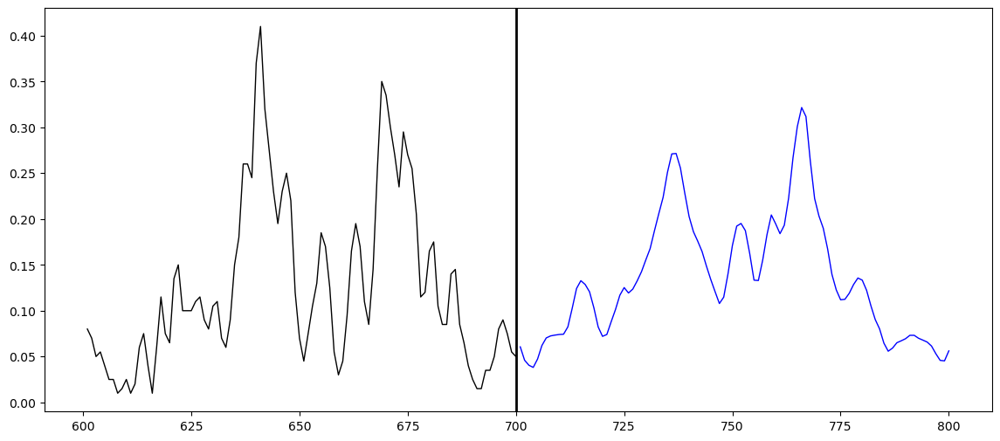

In [171]:
plt.figure(figsize=(14, 6)) 

plt.plot(forecast_df.index[100:], forecast_df["y_hat_smooth"][100:], color="blue", linewidth=1)
# plt.plot(forecast_df.index, forecast_df["y_test"], color="black", linewidth=1)
plt.plot(forecast_df.index[:100], forecast_df["y_test"][:100], color="black", linewidth=1)

plt.axvline(700, color="black", linewidth=2)
# plt.axhline(mean_y_hat, color="black", linewidth=2)


# plt.fill_between(forecast_df.index, forecast_df["lower_bound"], forecast_df["upper_bound"], color="lightblue")

#### Smoothing

##### Savitzky-Golay

In [173]:
window_length = 9  # Must be an odd number
polyorder = 2  # Polynomial order

forecast_df = pd.DataFrame(columns=["y_hat", "y_test"])
forecast_df["y_hat"] = y_hat_ma
forecast_df["y_test"] = y_test_ma
forecast_df = forecast_df.dropna()
forecast_df["y_test_smooth"] = savgol_filter(forecast_df["y_test"], window_length, polyorder)
forecast_df["y_test_ema"] = forecast_df["y_test"].ewm(span=4, adjust=False).mean().shift(-1)

forecast_df = forecast_df[600:800]


fig = make_subplots()
fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df["y_test"], name="test", marker=dict(color="black")))
fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df["y_test_smooth"], name="test_smooth", marker=dict(color="blue")))
# fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df["y_test_ema"], name="y_test_ema", marker=dict(color="green")))

fig.update_layout(width=1400, height=700)

In [165]:
window_length = 9  # Must be an odd number
polyorder = 2  # Polynomial order

forecast_df = pd.DataFrame(columns=["y_hat", "y_test"])
forecast_df["y_hat"] = y_hat_ma
forecast_df["y_test"] = y_test_ma
forecast_df = forecast_df.dropna()
forecast_df["y_test_smooth"] = savgol_filter(forecast_df["y_test"], window_length, polyorder)
forecast_df["y_test_ema"] = forecast_df["y_test"].ewm(span=4, adjust=False).mean().shift(-1)

forecast_df = forecast_df[600:800]

above_df = forecast_df.copy()
above_df["y_test_smooth"] = np.where(forecast_df["y_test_smooth"] >= mean_y_hat, above_df["y_test_smooth"], mean_y_hat)

fig = make_subplots()
fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df["y_test_smooth"], name="test_smooth", marker=dict(color="blue")))
fig.add_trace(go.Scatter(x=forecast_df.index, y=np.full(200, mean_y_hat), opacity=0, marker=dict(color="blue")))
fig.add_trace(go.Scatter(x=above_df.index, y=above_df["y_test_smooth"], fill="tonexty",marker=dict(color="blue"))).update_traces(connectgaps=False)

fig.update_traces(connectgaps=False)

fig.update_layout(width=1400, height=700)

##### EMA

In [108]:
window_length = 4

forecast_df = pd.DataFrame(columns=["y_hat", "y_test"])
forecast_df["y_hat"] = y_hat_ma
forecast_df["y_test"] = y_test_ma
forecast_df = forecast_df.dropna()
forecast_df["y_test_smooth"] = forecast_df["y_test"].ewm(span=window_length, adjust=False).mean().shift(-1)

forecast_df = forecast_df[600:800]


fig = make_subplots()
fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df["y_test"], name="test", marker=dict(color="black")))
fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df["y_test_smooth"], name="test_smooth", marker=dict(color="blue")))
fig.update_layout(width=1400, height=700)

### Forecast the next day at once (multiple models)

In [28]:
with open("cols_not_flt.json","r") as f:
    cols_not_flt = json.load(f)

with open("flt_nums.json","r") as f:
    flt_nums = json.load(f)

In [29]:
columns = cols_not_flt + flt_nums

In [30]:
len(columns)

652

In [76]:
def forecast_next_24h_x(df_train_f, df_test_f, n_periods=96, train_new_models=False):
    df_test_2_f = df_test_f.copy()
    df_test_2_f.iloc[df_test_2_f.index % n_periods !=0, :n_periods] = np.nan
    df_test_2_f = df_test_2_f.ffill()
    df_test_2_f = df_test_2_f.reindex(columns=columns)
    df_test_2_f   # A dataframe where we know the data for y_t-n for only today and the other variable data for tomorrow


    lagged_dfs_train = []
    for i in range(n_periods+1):
        lagged_df_train = df_train_f.copy().astype("float64")
        lagged_df_train.iloc[:,n_periods:] = lagged_df_train.iloc[:,n_periods:].shift(-i)
        lagged_df_train = lagged_df_train.dropna()
        lagged_dfs_train.append(lagged_df_train)

    lagged_dfs_test = []
    for i in range(n_periods+1):
        lagged_df_test = df_test.copy().astype("float64")
        lagged_df_test.iloc[:,n_periods:] = lagged_df_test.iloc[:,n_periods:].shift(-i)
        lagged_df_test = lagged_df_test.dropna()
        lagged_dfs_test.append(lagged_df_test)

    if train_new_models:
        models = []
        for train_df in lagged_dfs_train:
            X_train = train_df.drop(["y"], axis=1)
            y_train = train_df["y"]

            X_train = np.array(X_train)
            y_train = np.array(y_train)

            model = Sequential([
                Input(shape=(X_train.shape[1],)),
                Dense(512, activation="relu"),
                Dense(256, activation="relu"),
                Dense(1)
            ])

            model.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=["mse"])
            model.fit(X_train, y_train, epochs=50, batch_size=64)
            models.append(model)

            model.save(f"models/model_t{len(models)}.keras")
    else:
        models = []

        model_import_list = os.listdir("models/")
        model_import_list = [int(x[7:-6]) for x in model_import_list]
        model_import_list = sorted(model_import_list)
        model_import_list = [f"model_t{x}.keras" for x in model_import_list]

        for file in model_import_list:
            model = tf.keras.models.load_model(f"models/{file}")
            models.append(model)



    y_preds = []

    for i in range(len(df_test_2_f)):
        model_num = i%n_periods
        X_test = df_test_2_f.iloc[i:i+1].drop(["y"], axis=1)
        X_test = np.array(X_test)

        y_pred = models[model_num].predict(X_test)
        y_pred = y_pred.reshape(1, -1)[0]
        y_preds.append(y_pred)

    preds = np.concatenate(y_preds)

    return preds

In [ ]:
df_train1, df_test = create_x_y_train_test(rides_df_train1, rides_df_test1, return_array=False)
df_train2, df_test = create_x_y_train_test(rides_df_train2, rides_df_test1, return_array=False)
df_train3, df_test = create_x_y_train_test(rides_df_train3, rides_df_test1, return_array=False)
df_train4, df_test = create_x_y_train_test(rides_df_train4, rides_df_test1, return_array=False)
_,_,_,_,y_dt = create_x_y_train_test(rides_df_train4, rides_df_test1, return_array=True)

#### Model

In [165]:
def create_dfs_for_model(rides_df_, flights_df_, sää_df_, window_len=96):
    window_len = window_len + 1
    forecast_df_features = rides_df_.copy()
    forecast_df_features = forecast_df_features.merge(sää_df_[:96], how="left")
    forecast_df_features["time"] = forecast_df_features['datetime'].dt.hour * 60 + forecast_df_features['datetime'].dt.minute
    forecast_df_features["weekday"] = forecast_df_features["datetime"].dt.weekday

    features = [
        "datetime",
        "weekday",
        "time",
        "temp",
        "rain"
    ]

    features_flights_bool = True

    n_shifts = len(forecast_df_features) - window_len -1

    columns = [f'y_t-{i}' for i in range(window_len)]

    df_train = pd.DataFrame(columns=columns[::-1])
    df_train = df_train.rename(columns={"y_t-0":"y"})

    for i, col in enumerate(df_train.columns):
        df_train = df_train.copy()
        df_train[col] = forecast_df_features["sum"].shift(-i)

    for i in range(n_shifts):
        for feature in features:
            df_train.loc[i, feature] = forecast_df_features[feature][window_len+i]

    if "weekday" in features:
        df_train = pd.get_dummies(df_train, columns=["weekday"], dtype="int")

    if features_flights_bool:
        df_train = df_train.merge(flights_df_, on="datetime", how="left")
        
    df_train = df_train.fillna(0)

    df_preds = df_train[["datetime", "y"]]
    df_preds["y"] = np.nan

    df_train.drop(columns="datetime", inplace=True)
    df_train.reset_index(drop=True, inplace=True)

    # scaler = joblib.load("scaler.gz")
    scaler = MinMaxScaler()
    scaler.fit(df_train.iloc[:,:100])
    joblib.dump(scaler, "scaler.gz")

    df_train.iloc[:,:100] = scaler.transform(df_train.iloc[:,:100])

    return df_train, df_preds

In [167]:
df_train1,_ = create_dfs_for_model(rides_df_train1, flight_nr_df_train, sää_df)
df_train2,_ = create_dfs_for_model(rides_df_train1, flight_nr_df_train, sää_df)
df_train3,_ = create_dfs_for_model(rides_df_train1, flight_nr_df_train, sää_df)
df_train4,_ = create_dfs_for_model(rides_df_train1, flight_nr_df_train, sää_df)

df_test,_ = create_dfs_for_model(rides_df_test1, flight_nr_df_test, sää_df)

In [139]:
df_train = pd.concat([df_train1, df_train2, df_train3, df_train4]).reset_index(drop=True)

In [92]:
lagged_dfs_train = []
for i in range(n_periods+1):
    lagged_df_train = df_train.copy().astype("float64")
    lagged_df_train.iloc[:,n_periods:] = lagged_df_train.iloc[:,n_periods:].shift(-i)
    lagged_df_train = lagged_df_train.dropna()
    lagged_dfs_train.append(lagged_df_train)

lagged_dfs_test = []
for i in range(n_periods+1):
    lagged_df_test = df_test.copy().astype("float64")
    lagged_df_test.iloc[:,n_periods:] = lagged_df_test.iloc[:,n_periods:].shift(-i)
    lagged_df_test = lagged_df_test.dropna()
    lagged_dfs_test.append(lagged_df_test)

In [ ]:
models = []
for train_df in lagged_dfs_train:
    X_train = train_df.drop(["y"], axis=1)
    y_train = train_df["y"]

    X_train = np.array(X_train)
    y_train = np.array(y_train)

    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(512, activation="relu"),
        Dense(256, activation="relu"),
        Dense(1)
    ])

    model.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=["mse"])
    model.fit(X_train, y_train, epochs=50, batch_size=64)
    models.append(model)

    model.save(f"models/model_t{len(models)}.keras")

In [ ]:
# preds = forecast_next_24h_x(df_train, df_test, train_new_models=False)
# preds

In [ ]:
preds_i = preds
y_test_i = y_test

# preds_i = inverse_transform_preds(preds)
# y_test_i = inverse_transform_preds(y_test)

In [ ]:
ma = 2
y_hat_ma = pd.Series(preds_i).rolling(ma).mean()
y_test_ma = pd.Series(y_test_i).rolling(ma).mean()

In [ ]:
plot_compare_forecast_2array(y_hat_ma, y_test_ma, dt.datetime(2024,7,15,0,15))

In [ ]:
stats_compare_forecast_2array(y_hat_ma, y_test_ma)

MAE: 3.48
RMSE: 4.681
WMAPE: 27.302 %
STD_DEV: 3.1 %


### NEW MODEL

In [35]:
def create_df(rides_df_):
    window_len = 96 + 1

    forecast_df_features = rides_df_.copy()
    forecast_df_features = forecast_df_features.merge(sää_df, how="left")
    forecast_df_features["time"] = forecast_df_features['datetime'].dt.hour * 60 + forecast_df_features['datetime'].dt.minute
    forecast_df_features["weekday"] = forecast_df_features["datetime"].dt.weekday
    forecast_df_features
    features = [
        "datetime",
        "weekday",
        "time",
        "temp",
        "rain"
    ]

    features_flights_bool = True

    n_shifts = len(forecast_df_features) - window_len -1

    columns = [f'y_t-{i}' for i in range(window_len)]

    df_train = pd.DataFrame(columns=columns[::-1])
    df_train = df_train.rename(columns={"y_t-0":"y"})

    for i, col in enumerate(df_train.columns):
        df_train = df_train.copy()
        df_train[col] = forecast_df_features["sum"].shift(-i)
        for feature in features:
            df_train[feature] = forecast_df_features[feature].shift(-96)

    df_train = pd.get_dummies(df_train, columns=["weekday"], dtype="int")

    df_train = df_train.dropna()

    df_train = df_train.merge(flight_nr_df, on="datetime", how="left")
        
    df_train = df_train.fillna(0)
    df_train.drop(columns="datetime", inplace=True)


    # scaler = MinMaxScaler()
    scaler = joblib.load("scaler_ME.gz")
    # scaler.fit(df_train.iloc[:,:100])
    # joblib.dump(scaler, "scaler.gz")
    df_train.iloc[:,:100] = scaler.transform(df_train.iloc[:,:100])

    df_train.reset_index(drop=True, inplace=True)

    return df_train

In [36]:
def inverse_transform_preds(y, df_train):
    y_pred_df = pd.DataFrame(columns=df_train.columns[:100])
    y_pred_df.iloc[:,0] = y
    scaler = joblib.load("scaler_ME.gz")
    y_pred_df = pd.DataFrame(scaler.inverse_transform(y_pred_df))
    y_transformed = y_pred_df.iloc[:,0].values
    return y_transformed

In [37]:
df_train1 = create_df(rides_df_train1)
df_train2 = create_df(rides_df_train2)
df_train3 = create_df(rides_df_train3)
df_train4 = create_df(rides_df_train4)
df_test = create_df(rides_df_test1)

df_train = pd.concat([df_train1, df_train2, df_train3, df_train4]).reset_index(drop=True)

In [38]:
lagged_dfs_train = []
for i in range(96+1):
    lagged_df_train = df_train.copy().astype("float64")
    lagged_df_train.iloc[:,96:] = lagged_df_train.iloc[:,96:].shift(-i)
    lagged_df_train = lagged_df_train.dropna()
    lagged_dfs_train.append(lagged_df_train)

lagged_dfs_test = []
for i in range(96+1):
    lagged_df_test = df_test.copy().astype("float64")
    lagged_df_test.iloc[:,96:] = lagged_df_test.iloc[:,96:].shift(-i)
    lagged_df_test = lagged_df_test.dropna()
    lagged_dfs_test.append(lagged_df_test)

In [ ]:
models = []
for train_df in lagged_dfs_train:
    X_train = train_df.drop(["y"], axis=1)
    y_train = train_df["y"]

    X_train = np.array(X_train)
    y_train = np.array(y_train)

    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(512, activation="relu"),
        Dense(256, activation="relu"),
        Dense(1)
    ])

    model.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=["mse"])
    model.fit(X_train, y_train, epochs=50, batch_size=64)
    models.append(model)

    model.save(f"models_ME/model_t{len(models)}.keras")

In [40]:
models = []

model_import_list = os.listdir("models_ME/")
model_import_list = [int(x[7:-6]) for x in model_import_list]
model_import_list = sorted(model_import_list)
model_import_list = [f"model_t{x}.keras" for x in model_import_list]

for file in model_import_list:
    model = tf.keras.models.load_model(f"models_ME/{file}")
    models.append(model)

In [41]:
df_test_2 = df_test.copy()
df_test_2.iloc[df_test_2.index % 96 !=0, :96] = np.nan
df_test_2 = df_test_2.ffill()

In [ ]:
y_preds = []

for i in range(len(df_test_2)):
    model_num = i%96
    X_test = df_test_2.iloc[i:i+1].drop(["y"], axis=1)
    X_test = np.array(X_test)

    y_pred = models[model_num].predict(X_test)
    y_pred = y_pred.reshape(1, -1)[0]
    y_preds.append(y_pred)

preds = np.concatenate(y_preds)

In [43]:
y_hat = savgol_filter(preds, 5,2)
y_test = df_test["y"]

y_hat = inverse_transform_preds(y_hat, df_train)
y_test = inverse_transform_preds(y_test, df_train)

In [44]:
fig = plot_compare_forecast_2array(y_hat, y_test, dt_start=False)
fig

In [45]:
stats_compare_forecast_2array(y_hat, y_test)

MAE: 0.583
RMSE: 0.81
WMAPE: 38.078 %
STD_DEV: 0.6 %


### Large model (y_t+96)

In [54]:
def create_large_df_train(rides_df_train_):
    rides_df_train_features = rides_df_train_.copy()
    # rides_df_train_features["weekday"] = rides_df_train_features["datetime"].dt.weekday
    # rides_df_train_features["time"] = rides_df_train_features['datetime'].dt.hour * 60 + rides_df_train_features['datetime'].dt.minute
    # rides_df_train_features = rides_df_train_features.merge(sää_df, how="inner")


    # features = [
    #     "datetime",
    #     "weekday",
    #     "time",
    #     # "Capacity",
    #     # "1d_ma",
    #     # "7d_ma",
    #     # "7d_lag",
    #     "temp",
    #     "rain"
    # ]

    # features_flights_bool = True
    n_shifts = len(rides_df_train_features) - window_len -1

    df_train = pd.DataFrame(columns=columns)

    for i in range(n_shifts):
        df_train.loc[i] = rides_df_train_features["sum"].values[i:window_len+i]

    # for i in range(n_shifts):
    #     for feature in features:
    #         df_train.loc[i, feature] = rides_df_train_features[feature][window_len+i]

    # if "weekday" in features:
    #     df_train = pd.get_dummies(df_train, columns=["weekday"], dtype="int")

    # if features_flights_bool:
    #     df_train = df_train.merge(flight_nr_df_train, on="datetime", how="inner")
        
    # df_train.drop(columns="datetime", inplace=True)
    df_train.dropna(inplace=True)
    df_train.reset_index(drop=True, inplace=True)

    return df_train

In [55]:
df_train["y"] = df_train["y"].astype(object)
df_train.at[0, "y"] = [1,2,3]

In [56]:
def create_large_df_test(rides_df_test_):
    rides_df_test_features = rides_df_test_.copy()
    # rides_df_test_features["weekday"] = rides_df_test_features["datetime"].dt.weekday
    # rides_df_test_features["time"] = rides_df_test_features['datetime'].dt.hour * 60 + rides_df_test_features['datetime'].dt.minute
    # rides_df_test_features = rides_df_test_features.merge(sää_df, how="inner")


    df_test = pd.DataFrame(columns=columns)
    n_shifts = len(rides_df_test_features) - window_len -1


    for i in range(n_shifts):
        df_test.loc[i] = rides_df_test_features["sum"].values[i:window_len+i]

    # for i in range(n_shifts):
    #     for feature in features:
    #         df_test.loc[i, feature] = rides_df_test_features[feature][window_len+i]

    # if "weekday" in features:
    #     df_test = pd.get_dummies(df_test, columns=["weekday"], dtype="int")

    # if features_flights_bool:
    #     df_test = df_test.merge(flight_nr_df_test, on="datetime", how="inner")
        
    # df_test.drop(columns="datetime", inplace=True)
    df_test.dropna(inplace=True)
    df_test.reset_index(drop=True, inplace=True)

    return df_test

In [ ]:
df_train1 = create_large_df_train(rides_df_train1)
df_train2 = create_large_df_train(rides_df_train2)
df_train3 = create_large_df_train(rides_df_train3)
df_train4 = create_large_df_train(rides_df_train4)

In [ ]:
df_test = create_large_df_test(rides_df_test1)

In [33]:
df_train = pd.concat([df_train1, df_train2, df_train3, df_train4]).reset_index(drop=True)

In [34]:
np.concatenate([df_train["y"], df_test["y"]]).mean()

15.351770562065376

In [35]:
scaler = MinMaxScaler()
scaler.fit(df_train.iloc[:,:])
joblib.dump(scaler, "scaler.gz")

df_train.iloc[:,:] = scaler.transform(df_train.iloc[:,:])
df_test.iloc[:,:] = scaler.transform(df_test.iloc[:,:])

In [36]:
X_train = np.array(df_train.iloc[:,:96])
y_train = np.array(df_train.iloc[:,96:])

X_test = np.array(df_test.iloc[:,:96])
y_test = np.array(df_test.iloc[:,96:])

In [37]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(10360, 96)
(10360, 97)
(1918, 96)
(1918, 97)


In [ ]:
model = Sequential([
  Input(shape=(96,)),
  # Dropout(0.1),
  Dense(1024, activation="relu"),
  Dense(512, activation="relu"),
  Dense(256, activation="relu"),
  Dense(97)
])

model.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), metrics=["mse"])

model.fit(X_train, y_train, epochs=50, batch_size=256)

In [41]:
y_hat = model.predict(X_test)

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [42]:
len(X_test)

1918

In [46]:
y_tests = []
y_hats = []

for i in range(0,1918,193):
    y_tests.append(y_test[i])
    y_hats.append(y_hat[i])
    

In [47]:
y_hats = np.concatenate(y_hats)
y_tests = np.concatenate(y_tests)

In [48]:
def inverse_transform_preds(y):
    y_pred_df = pd.DataFrame(columns=df_train.columns)
    y_pred_df.iloc[:,0] = y
    scaler = joblib.load("scaler.gz")
    y_pred_df = pd.DataFrame(scaler.inverse_transform(y_pred_df))
    y_transformed = y_pred_df.iloc[:,0].values
    return y_transformed

In [49]:
y_hats = inverse_transform_preds(y_hats)
y_tests = inverse_transform_preds(y_tests)


In [50]:
fig = plot_compare_forecast_2array(y_hats, y_tests, dt_start=False)
# fig.update_layout(width=1200)
fig

In [51]:
stats_compare_forecast_2array(y_hats, y_tests)

MAE: 3.816
RMSE: 5.075
WMAPE: 29.039 %
STD_DEV: 3.3 %


In [261]:
def predict(model_=model, X_test_=X_test, ma=2, shift=0):
    y_hat = model_.predict(X_test)
    y_hat = y_hat.reshape(1, -1)[0]
    
    y_hat_ = inverse_transform_preds(y_hat)
    y_test_ = inverse_transform_preds(y_test)

    y_hat_ma = pd.Series(y_hat_).rolling(ma).mean().shift(shift)
    y_test_ma = pd.Series(y_test_).rolling(ma).mean().shift(shift)

    # y_hat_ma = savgol_filter(y_hat_, 9, 2)
    # y_test_ma = savgol_filter(y_test_, 9, 2)

    return y_hat_ma, y_test_ma

In [ ]:
y_hat_ma, y_test_ma = predict(model)

In [ ]:
plot_compare_forecast_2array(y_hat_ma, y_test_ma, dt_start=False)

In [ ]:
stats_compare_forecast_2array(y_hat_ma, y_test_ma)

MAE: 0.833
RMSE: 1.078
WMAPE: 6.486 %
STD_DEV: 0.7 %


#### With features

In [119]:
savgol_filter(rides_df["ME"], 5, 2).max()

16.942857142857136

In [120]:
def min_max_scaler(arr, mode):
    name = arr.name
    arr = np.array(arr)

    if mode == "new":

        min_val = np.min(arr).astype(float)
        max_val = np.max(arr).astype(float)

        with open("scaler.json", "r") as f:
            dict = json.load(f)

        dict[name] = [min_val, max_val]

        with open("scaler.json", "w") as f:
            json.dump(dict, f)

    elif mode == "old":
        with open("scaler.json", "r") as f:
            dict = json.load(f)
        min_val = dict[name][0]
        max_val = dict[name][1]


    scaled_arr = (arr - min_val) / (max_val - min_val)

    # tallenna scaler/hae vanha skaalaus
    
    return scaled_arr

In [121]:
def inverse_min_max_scaler(arr):
    # vain sum
    arr = np.array(arr)

    with open("scaler.json", "r") as f:
        dict = json.load(f)
    min_val = dict["sum"][0]
    max_val = dict["sum"][1]


    new_arr = arr * (max_val - min_val) + min_val
    
    return new_arr

In [122]:
def create_df(rides_df_, scaler_mode):
    window_len = 96*2 + 1
    columns = [f'y_t-{i+1}' for i in range(96)[::-1]] + ["y"] + [f'y_t+{i+1}' for i in range(96)]

    # ME
    rides_df_ = rides_df_.drop(columns=["sum"]).rename(columns={"ME":"sum"})
    rides_df_["sum"] = savgol_filter(rides_df_["sum"], 9, 2)

    # join features
    rides_df_train_features = rides_df_.copy()
    rides_df_train_features["weekday"] = rides_df_train_features["datetime"].dt.weekday
    rides_df_train_features["time"] = rides_df_train_features['datetime'].dt.hour * 60 + rides_df_train_features['datetime'].dt.minute
    rides_df_train_features = rides_df_train_features.merge(sää_df, how="left")
    rides_df_train_features = rides_df_train_features.merge(flights_df, how="left")
    rides_df_train_features = rides_df_train_features.fillna(0)

    # minmax
    rides_df_train_features["sum"] = min_max_scaler(rides_df_train_features["sum"], scaler_mode)
    rides_df_train_features["weekday"] = min_max_scaler(rides_df_train_features["weekday"], scaler_mode)
    rides_df_train_features["time"] = min_max_scaler(rides_df_train_features["time"], scaler_mode)
    rides_df_train_features["temp"] = min_max_scaler(rides_df_train_features["temp"], scaler_mode)
    rides_df_train_features["rain"] = min_max_scaler(rides_df_train_features["rain"], scaler_mode)
    rides_df_train_features["Capacity"] = min_max_scaler(rides_df_train_features["Capacity"], scaler_mode)


    # flights
    rides_df_train_features2 = rides_df_train_features.merge(flight_nr_df_train, how="left")
    rides_df_train_features2 = rides_df_train_features2.fillna(0)
    rides_df_train_features2 = rides_df_train_features2.astype(object)
    flt_col = rides_df_train_features2.iloc[:,11:].apply(lambda row: np.array(row) * 0.1, axis=1)
    rides_df_train_features["flt"] = flt_col

    # all_feat
    rides_df_train_features.fillna(0)

    rides_df_train_features["sum"] = rides_df_train_features["sum"].apply(lambda x: np.array(x)).astype(object)
    rides_df_train_features["weekday"] = rides_df_train_features["weekday"].apply(lambda x: np.array(x)).astype(object)
    rides_df_train_features["time"] = rides_df_train_features["time"].apply(lambda x: np.array(x)).astype(object)
    rides_df_train_features["temp"] = rides_df_train_features["temp"].apply(lambda x: np.array(x)).astype(object)
    rides_df_train_features["rain"] = rides_df_train_features["rain"].apply(lambda x: np.array(x)).astype(object)
    rides_df_train_features["Capacity"] = rides_df_train_features["Capacity"].apply(lambda x: np.array(x)).astype(object)

    rides_df_train_features = rides_df_train_features[["sum", "weekday", "time", "temp", "rain", "flt", "Capacity"]]

    rides_df_train_features["all_feat_fut"] = rides_df_train_features.apply(lambda row: np.array([row["weekday"], row["time"], row["temp"], row["rain"]]), axis=1)
    # rides_df_train_features["all_feat_fut"] = rides_df_train_features.apply(lambda row: np.concatenate([row["all_feat_fut"], row["flt"]]), axis=1)

    rides_df_train_features["all_feat_past"] = rides_df_train_features.apply(lambda row: np.array([row["sum"], row["weekday"], row["time"]]), axis=1)


    n_shifts = len(rides_df_train_features) - window_len -1

    df_train = pd.DataFrame(columns=columns, dtype=object)

    # pelkät sum-arvot
    for i, col in enumerate(df_train.columns):
        df_train[col] = rides_df_train_features["sum"].shift(-i)

    # future ys
    df_train = df_train.copy()
    df_train["fut_y"] = df_train.iloc[:,96:].apply(lambda row: np.array(row), axis=1)

    # past features
    for i, col in enumerate(df_train.columns[:96]):
        df_train[col] = rides_df_train_features["all_feat_past"].shift(-i)

    # future featueres
    for i, col in enumerate(df_train.columns[96:-1]):
        df_train[col] = rides_df_train_features["all_feat_fut"].shift(-i-96)

    df_train.dropna(inplace=True)

    
    return df_train

In [123]:
def create_df_only_flt(rides_df_):
    window_len = 96*2 + 1
    columns = [f'y_t-{i+1}' for i in range(96)[::-1]] + ["y"] + [f'y_t+{i+1}' for i in range(96)]

    rides_df_train_features = rides_df_.copy()
    rides_df_train_features = rides_df_train_features.fillna(0)

    rides_df_train_features2 = rides_df_train_features.merge(flight_nr_df_train, how="left")
    rides_df_train_features2 = rides_df_train_features2.fillna(0)
    rides_df_train_features2 = rides_df_train_features2.astype(object)
    flt_col = rides_df_train_features2.iloc[:,11:].apply(lambda row: np.array(row) * 0.1, axis=1)
    rides_df_train_features["flt"] = flt_col


    n_shifts = len(rides_df_train_features) - window_len -1

    df_train = pd.DataFrame(columns=columns, dtype=object)

    # pelkät sum-arvot
    for i, col in enumerate(df_train.columns):
        df_train[col] = rides_df_train_features["flt"].shift(-i)

    df_train.dropna(inplace=True)

    return df_train.iloc[:,96:]

In [124]:
df_train1 = create_df(rides_df_train1, scaler_mode="old")
df_train2 = create_df(rides_df_train2, scaler_mode="old")
df_train3 = create_df(rides_df_train3, scaler_mode="old")
df_train4 = create_df(rides_df_train4, scaler_mode="old")
df_test = create_df(rides_df_test1, scaler_mode="old")

df_train = pd.concat([df_train1, df_train2, df_train3, df_train4]).reset_index(drop=True)

In [125]:
X_train = np.array(df_train.iloc[:,:-1])
X_train = np.array([np.concatenate(row) for row in X_train]).astype(float)

y_train = df_train.iloc[:,-1].values
y_train = np.array([[item for item in row] for row in y_train]).astype(float)

X_test = np.array(df_test.iloc[:,:-1])
X_test = np.array([np.concatenate(row) for row in X_test]).astype(float)

y_test = df_test.iloc[:,-1].values
y_test = np.array([[item for item in row] for row in y_test]).astype(float)

In [126]:
print(X_train.shape)
print(y_train.shape)

print(X_test.shape)
print(y_test.shape)

(10464, 676)
(10464, 97)
(1728, 676)
(1728, 97)


In [127]:
# %load_ext tensorboard

In [ ]:
# no flt/capacity

model_no_flt = Sequential([
  Input(shape=X_train.shape[1:]),
  Flatten(),
  Dropout(0.05),
  Dense(2048, activation="relu"),
  # Dropout(0.1),
  Dense(1024, activation="relu"),
  Dense(512, activation="relu"),
  Dense(97)
])


model_no_flt.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=7e-5), metrics=["mse"])

log_dir = "logs/fit/" + dt.datetime.now().strftime("%Y%m%d-%H%M%S")
# log_dir = "logs/fit/" + "dropout=0.06, lr=8e-5, batch_size=2^9, Dense(2048)+Dense(1024)+Dense(512), epochs=150 - capacity, savgol"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model_no_flt.fit(X_train, y_train, epochs=100, batch_size=2**9, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])  # 2**8 = 256 -    2**9 = 512 -    2**10 = 1028 -    2**11 = 2048 (ei hyvä)

##### Two step model

In [104]:
y_hat_test = model_no_flt.predict(X_test)

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [87]:
y_hat_train = model_no_flt.predict(X_train)

390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [106]:
df_train1_flt = create_df_only_flt(rides_df_train1)
df_train2_flt = create_df_only_flt(rides_df_train2)
df_train3_flt = create_df_only_flt(rides_df_train3)
df_train4_flt = create_df_only_flt(rides_df_train4)
df_test_flt = create_df_only_flt(rides_df_test1)

df_train_flt = pd.concat([df_train1_flt, df_train2_flt, df_train3_flt, df_train4_flt]).reset_index(drop=True)

In [107]:
df_train_flt = df_train_flt.join(pd.DataFrame(y_hat_train))
df_test_flt = df_test_flt.join(pd.DataFrame(y_hat_test))

In [108]:
df_train_flt = df_train_flt.map(lambda x: np.array(x).flatten())
X_train = np.array(df_train_flt)
X_train = np.array([np.concatenate(row) for row in X_train]).astype(float)

df_test_flt = df_test_flt.map(lambda x: np.array(x).flatten())
X_test = np.array(df_test_flt)
X_test = np.array([np.concatenate(row) for row in X_test]).astype(float)

In [109]:
print(X_train.shape)
print(y_train.shape)

print(X_test.shape)
print(y_test.shape)

(12480, 52671)
(12480, 97)
(1056, 52671)
(1056, 97)


In [ ]:
model_with_flt = Sequential([
  Input(shape=X_train.shape[1:]),
  Flatten(),
  Dropout(0.05),
  Dense(2048, activation="relu"),
  # Dropout(0.1),
  Dense(1024, activation="relu"),
  Dense(512, activation="relu"),
  Dense(97)
])


model_with_flt.compile(loss="mean_squared_error", optimizer=tf.keras.optimizers.Adam(learning_rate=7e-5), metrics=["mse"])

# log_dir = "logs/fit/" + dt.datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = "logs/fit/" + "dropout=0.05, lr=7e-5, batch_size=2^11, Dense(2048)+Dense(1024)+Dense(512) - with flt (2-step)"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model_with_flt.fit(X_train, y_train, epochs=100, batch_size=2**11, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])  # 2**8 = 256 -    2**9 = 512 -    2**10 = 1028 -    2**11 = 2048 (ei hyvä)

##### Preds

In [129]:
y_hat = model_no_flt.predict(X_test)

54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [130]:
len(X_test)

1728

In [134]:
y_tests = []
y_hats = []

for i in range(0,len(X_test),96):
    y_tests.append(y_test[i])
    y_hats.append(y_hat[i])
    
y_hats = np.concatenate(y_hats)
y_tests = np.concatenate(y_tests)

y_hats = savgol_filter(y_hats,5,2)

y_hats = inverse_min_max_scaler(y_hats)
y_tests = inverse_min_max_scaler(y_tests)

y_hats = np.clip(y_hats, 0, 100)
y_tests = np.clip(y_tests, 0, 100)

In [135]:
fig = plot_compare_forecast_2array(y_hats, y_tests, dt_start=False)
# fig.update_layout(width=1200)
fig

In [136]:
stats_compare_forecast_2array(y_hats, y_tests)

MAE: 0.677
RMSE: 0.946
WMAPE: 37.609 %
STD_DEV: 0.7 %


# Visuals

In [218]:
df_train1 = create_large_df_train(rides_df_train1)
df_train2 = create_large_df_train(rides_df_train2)
df_train3 = create_large_df_train(rides_df_train3)
df_train4 = create_large_df_train(rides_df_train4)

In [219]:
df_test = create_large_df_test(rides_df_test1)

In [220]:
df_train = pd.concat([df_train1, df_train2, df_train3, df_train4]).reset_index(drop=True)

In [227]:
values = np.concatenate([df_train["y"], df_test["y"]])

In [ ]:
df = pd.DataFrame(columns=["dt", "y", "over"])
df["y"] = values
df["over"] = df["y"]>values.mean()

# create categories
df['group'] = (df['over'] != df['over'].shift()).cumsum()
df['group'] = df['group'].where(df['over'], np.nan)
df['group'] = df['group'].fillna(0)
df['group'] = df['group'].astype('category').cat.codes
df['group'] = df['group'].replace({0: np.nan})

# filter out low sums
df_gp = df.groupby("group")["y"].sum().reset_index().rename(columns={"y":"sum"})
df = df.merge(df_gp, on="group", how="left")
df["over"] = df["sum"]>150

# fillter out low peaks
df_gp = df.groupby("group")["y"].max().reset_index().rename(columns={"y":"max"})
df = df.merge(df_gp, on="group", how="left")
df["over"] = df["max"]>20

df = df.drop(columns="max")

# # #
df["y"] = savgol_filter(df["y"], 9,2)

df['sum'] = df['sum'].where(df['over'], np.nan)
df['group'] = df['group'].where(df['over'], np.nan)
# peak middle point

df = df.bfill()
df = df.ffill()

dfs = []
for group in df["group"].unique():
    df2 = df[df["group"]==group]
    dfs.append(df2)

df.head(60)

In [ ]:
df_train1 = create_large_df_train(rides_df_train1)
df_train2 = create_large_df_train(rides_df_train2)
df_train3 = create_large_df_train(rides_df_train3)
df_train4 = create_large_df_train(rides_df_train4)

In [ ]:
df_test = create_large_df_test(rides_df_test1)

In [ ]:
df_train = pd.concat([df_train1, df_train2, df_train3, df_train4]).reset_index(drop=True)

In [ ]:
df = pd.DataFrame(columns=["dt", "y", "over"])
df["dt"] = dt_range
df["y"] = preds
df["over"] = df["y"]>preds.mean()
df['group'] = (df['over'] != df['over'].shift()).cumsum()
df['group'] = df['group'].where(df['over'], np.nan)
df['group'] = df['group'].fillna(0)
df['group'] = df['group'].astype('category').cat.codes
df['group'] = df['group'].replace({0: np.nan})
df_gp = df.groupby("group")["y"].sum().reset_index().rename(columns={"y":"sum"})
df = df.merge(df_gp, on="group", how="left")
df["over"] = df["sum"]>100
df["y"] = savgol_filter(df["y"], 9,2)
df.head(30)

## New visuals

In [246]:
from scipy.signal import argrelmin
import random
import plotly.io as pio
pd.set_option('future.no_silent_downcasting', True)

In [221]:
# df.loc[df.y.values<df.y.values.mean(), "y"] = np.nan
# px.scatter(x=df["datetime"], y=df["y"])

In [ ]:
df = rides_df[["datetime", "sum"]].tail(400)
df["sum"] = savgol_filter(df["sum"], 9, 2)
df["sum"] = df["sum"].clip(lower=0)
df["sum"] = df["sum"].rolling(5).mean()
df = df.rename(columns={"sum": "y"}).dropna().reset_index(drop=True)

minima = argrelmin(df.y.values, order=2)[0]
df["group"] = False
df.loc[minima, "group"] = True

df["group"] = df["group"].replace({False:np.nan})
df["group"] = df["group"].cumsum()

df = df.ffill()
df = df.bfill()

df["group"] = df["group"].astype(str)

df["y2"] = df["y"].copy()

cutoff = df.y.quantile(0.5)

df.loc[df.y.values<cutoff, "y2"] = np.nan
df_gp = df.groupby("group")["y2"].sum().reset_index().rename(columns={"y2":"sum"})
df = df.merge(df_gp, on="group", how="left")
df = df.drop(columns="y2")

df["group"] = df["group"].where(df["sum"]>150, np.nan)
df["group"] = df["group"].fillna(np.nan)

df["sum"] = df["sum"].where(~df.group.isna(), np.nan)

df = df.ffill()
df = df.bfill()

df

In [259]:
px.scatter(df, x="datetime", y="y", color="group", hover_data="sum")

In [260]:
ME=False

df = rides_df[["datetime", "sum"]].tail(400)
df["sum"] = savgol_filter(df["sum"], 9, 2)
df["sum"] = df["sum"].clip(lower=0)
df["sum"] = df["sum"].rolling(5).mean()
df = df.rename(columns={"sum": "y", "datetime":"dt"}).dropna().reset_index(drop=True)

minima = argrelmin(df.y.values, order=2)[0]
df["group"] = False
df.loc[minima, "group"] = True

df["group"] = df["group"].replace({False:np.nan})
df["group"] = df["group"].cumsum()

df = df.ffill()
df = df.bfill()

df["group"] = df["group"].astype(str)

df["y2"] = df["y"].copy()

cutoff = df.y.quantile(0.5)

df.loc[df.y.values<cutoff, "y2"] = np.nan
df_gp = df.groupby("group")["y2"].sum().reset_index().rename(columns={"y2":"sum"})
df = df.merge(df_gp, on="group", how="left")
df = df.drop(columns="y2")

df["group"] = df["group"].where(df["sum"]>150, np.nan)
df["group"] = df["group"].fillna(np.nan)

df["sum"] = df["sum"].where(~df.group.isna(), np.nan)

df = df.ffill()
df = df.bfill()

if ME:
    df["sum"] = df["sum"].round(1).astype(int)
else:
    df["sum"] = df["sum"].round(-1).astype(int)


dfs = []
for group in df["group"].unique():
    df2 = df[df["group"]==group]

    next_row_index = df2.index[-1] + 1
    if next_row_index < len(df):
        next_row = df.iloc[next_row_index:next_row_index + 1]
        df2 = pd.concat([df2, next_row])

    df2 = df2.reset_index(drop=True)

    df2["max"] = df2["y"].max()
    df2["dt_max"] = df2[df2["y"]==df2["max"][0]]["dt"]

    dfs.append(df2)

In [261]:
def trans_col(string):
    r = int(string[5:].split(",")[0])
    g = int(string[5:].split(",")[1])
    b = int(string[5:].split(",")[2])

    r_new = np.mean([r, 255])
    g_new = np.mean([g, 255])
    b_new = np.mean([b, 255])

    return f"rgba({r_new},{g_new},{b_new},0.5)"

top_colors = [
    "rgba(0,191,255,  0.8)",
    "rgba(255,179,102,  0.7)",
    "rgba(255,80,0,  0.9)",
    "rgba(256,0,0,  0.8)"
]

colorscales = [[(0, "rgba(256,256,256,  0)"), (0.4, "rgba(256,256,256,  0)"), (0.8, trans_col(top_colors[0])), (1, top_colors[0])],
               [(0, "rgba(256,256,256,  0)"), (0.4, "rgba(256,256,256,  0)"), (0.8, trans_col(top_colors[1])), (1, top_colors[1])],
               [(0, "rgba(256,256,256,  0)"), (0.4, "rgba(256,256,256,  0)"), (0.8, trans_col(top_colors[2])), (1, top_colors[2])],
               [(0, "rgba(256,256,256,  0)"), (0.4, "rgba(256,256,256,  0)"), (0.8, trans_col(top_colors[3])), (1, top_colors[3])] 
]

def select_color(value, ME):
    if ME:
        x = 0.5
    else:
        x = 1

    if value < 180 * x:
        return 0
    elif 180 * x <= value < 330 * x:
        return 1
    elif 330 * x <= value < 490 * x:
        return 2
    elif value >= 490 * x:
        return 3
    else:
        return None

def round_to_next_series_hour(datetime_value):
    hour = datetime_value.hour
    
    next_hour = ((hour // 3) + 1) * 3
    
    if next_hour >= 24:
        next_hour = 0
        datetime_value += pd.Timedelta(days=1)
    
    rounded_datetime = datetime_value.replace(hour=next_hour)
    
    return rounded_datetime


In [262]:
fig = make_subplots()

for df_to_plot in dfs:
    color_level = select_color(df_to_plot["sum"][0], ME)
    fig.add_trace(go.Scatter(
        x=df_to_plot["dt"], 
        y=df_to_plot["y"], 
        fill="tozeroy", 
        mode="lines", 
        line=dict(color="#888888"),
        fillgradient=dict(type="vertical", colorscale=colorscales[color_level]),
        line_shape="spline"
    ))
    if df_to_plot["dt_max"].max() != df_to_plot["dt"][0] and df_to_plot["dt_max"].max() != df_to_plot["dt"].values[-1]:
        if ME:
            delta = 0.5
        else:
            delta = 2
        fig.add_annotation(x=df_to_plot["dt_max"].max(), y=df_to_plot["y"].max()+delta, text=str(df_to_plot["sum"][0]), showarrow=False, font=dict(size=16))

fig

In [263]:
pio.write_image(fig, "plot_test.png", width=10*200, height=2.5*200, scale=3)